In [11]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical
import pandas as pd
from datetime import datetime
import numpy as np
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.model_selection import train_test_split
from sklearn.linear_model import SGDRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import VotingRegressor
from sklearn.datasets import make_regression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
import warnings
import matplotlib.pyplot as plt
df = pd.read_csv('stations_data.csv', sep=',')
def map_to_five(x):
    return min(x, 5)
df['rounded_last_update_5mins'] = pd.to_datetime(df['rounded_last_update_5mins'])
df['time_as_fraction'] = df['rounded_last_update_5mins'].dt.hour * 3600 + df['rounded_last_update_5mins'].dt.minute * 60 + df['rounded_last_update_5mins'].dt.second
df['day'] = df['rounded_last_update_5mins'].dt.day
df['month'] = df['rounded_last_update_5mins'].dt.month
weekday=df['rounded_last_update_5mins'].dt.dayofweek
weekdaydf = pd.get_dummies(weekday, prefix='day_of_week')
df = pd.concat([df, weekdaydf], axis=1)



In [16]:
x_set = df[['number','time_as_fraction','month','day','day_of_week_0','day_of_week_1','day_of_week_2','day_of_week_3','day_of_week_4','day_of_week_5','day_of_week_6','temp','feels_like','weatherid','rain_1h','wind_speed']]
y_set = df['available_bikes']
print(x_set.shape)





(622721, 16)


(622721, 16)
Descriptive statistics for input features:


,number,time_as_fraction,month,day,day_of_week_0,day_of_week_1,day_of_week_2,day_of_week_3,day_of_week_4,day_of_week_5,day_of_week_6,temp,feels_like,weatherid,rain_1h,wind_speed
count,622721.00,622721.00,622721.00,622721.00,622721.00,622721.00,622721.00,622721.00,622721.00,622721.00,622721.00,622721.00,622721.00,622721.00,622721.00,622721.00
mean,-0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-1.68,-1.82,-3.65,-1.73,-0.38,-0.40,-0.45,-0.45,-0.43,-0.38,-0.37,-2.66,-2.67,-2.90,-0.29,-1.93
25%,-0.88,-0.83,0.27,-0.92,-0.38,-0.40,-0.45,-0.45,-0.43,-0.38,-0.37,-0.62,-0.70,0.47,-0.29,-0.77
50%,-0.03,0.02,0.27,-0.00,-0.38,-0.40,-0.45,-0.45,-0.43,-0.38,-0.37,-0.06,-0.18,0.48,-0.29,-0.01
75%,0.88,0.83,0.27,0.92,-0.38,-0.40,-0.45,-0.45,-0.43,-0.38,-0.37,0.68,0.89,0.48,-0.29,0.75
max,1.74,1.75,0.27,1.49,2.63,2.52,2.22,2.23,2.31,2.66,2.71,2.33,2.19,0.49,9.50,3.22



Descriptive statistics for target feature:


,available_bike_stands
count,622721.00
mean,-0.00
std,1.00
min,-1.23
25%,-0.83
50%,-0.13
75%,0.67
max,2.76


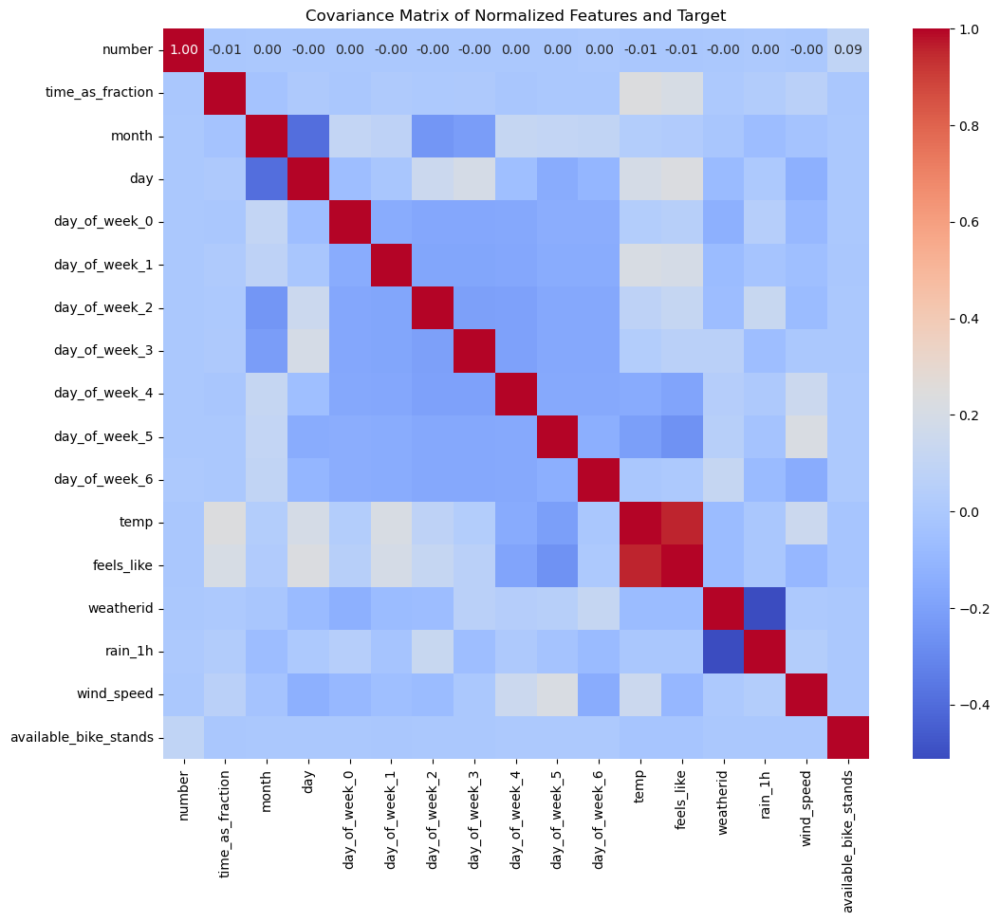

In [20]:
import seaborn as sns
# Print the shape of x_set
print(x_set.shape)

# Calculate descriptive statistics for the x_set


# Assuming 'x_set' and 'y_set' are already defined and loaded correctly
scaler_x = StandardScaler()
x_set_normalized = scaler_x.fit_transform(x_set)
x_set_normalized = pd.DataFrame(x_set_normalized, columns=x_set.columns)

# Normalize the target
scaler_y = StandardScaler()
y_set_normalized = scaler_y.fit_transform(y_set.values.reshape(-1, 1))  # Reshape is needed as it's a single feature
y_set_normalized = pd.DataFrame(y_set_normalized, columns=['available_bike_stands'])

# Combine normalized features with the normalized target
data_normalized = pd.concat([x_set_normalized, y_set_normalized], axis=1)

# Compute the covariance matrix
cov_matrix = data_normalized.cov()

# Calculating descriptive statistics for the x_set and y_set
descriptive_stats_x = x_set_normalized.describe()
descriptive_stats_y = y_set_normalized.describe()

# Format the descriptive statistics for nicer output
def style_stats(stats):
    return (stats
            .style
            .set_table_styles([{'selector': 'th', 'props': [('font-size', '12pt'), ('text-align', 'center')]},
                               {'selector': 'td', 'props': [('text-align', 'center')]}])
            .background_gradient(cmap='coolwarm', axis=None)
            .format("{:.2f}"))

print("Descriptive statistics for input features:")
styled_stats_x = style_stats(descriptive_stats_x)
display(styled_stats_x)

print("\nDescriptive statistics for target feature:")
styled_stats_y = style_stats(descriptive_stats_y)
display(styled_stats_y)

# Plotting the covariance matrix
plt.figure(figsize=(12, 10))
sns.heatmap(cov_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Covariance Matrix of Normalized Features and Target')
plt.show()

In [4]:
station_number = x_set['number'].unique()
print(station_number)
x_set.columns

[  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  47  48  49  50  51  52  53  54  55
  56  57  58  59  60  61  62  63  64  65  66  67  68  69  71  72  73  74
  75  76  77  78  79  80  82  83  84  85  86  87  88  89  90  91  92  93
  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108 109 110 111
 112 113 114 115 116 117]


Index(['number', 'time_as_fraction', 'month', 'day', 'day_of_week_0',
       'day_of_week_1', 'day_of_week_2', 'day_of_week_3', 'day_of_week_4',
       'day_of_week_5', 'day_of_week_6', 'temp', 'feels_like'],
      dtype='object')

In [5]:
def r_squared(y_true, y_pred):
   
    residual_sum_of_squares = np.sum(np.square(y_true - y_pred))
    total_sum_of_squares = np.sum(np.square(y_true - np.mean(y_true)))
    return 1 - (residual_sum_of_squares / total_sum_of_squares)

0.8483009689305668
20.10443864229765
<class 'pandas.core.frame.DataFrame'> 1915 1915


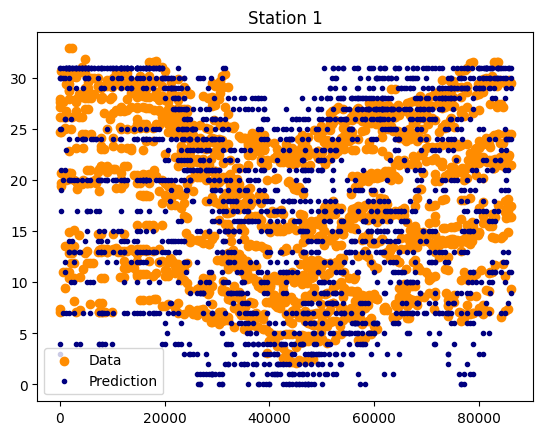

0.7920188497811906
33.724340175953074
<class 'pandas.core.frame.DataFrame'> 1705 1705


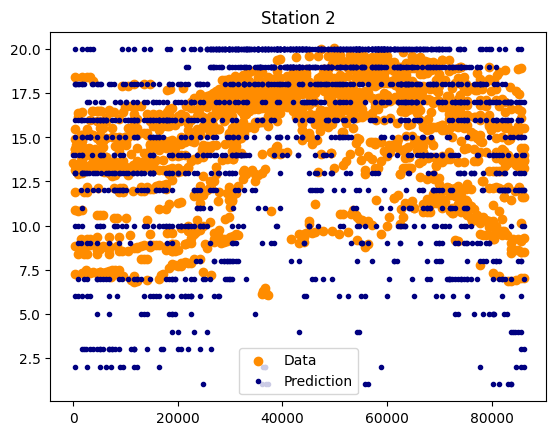

0.8160078105642625
27.19869706840391
<class 'pandas.core.frame.DataFrame'> 1842 1842


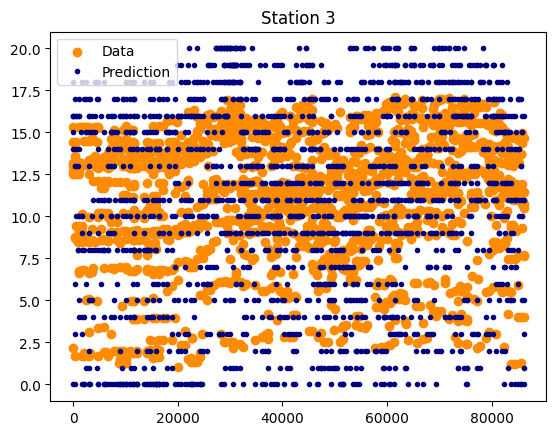

0.8074770858128357
31.103286384976524
<class 'pandas.core.frame.DataFrame'> 1704 1704


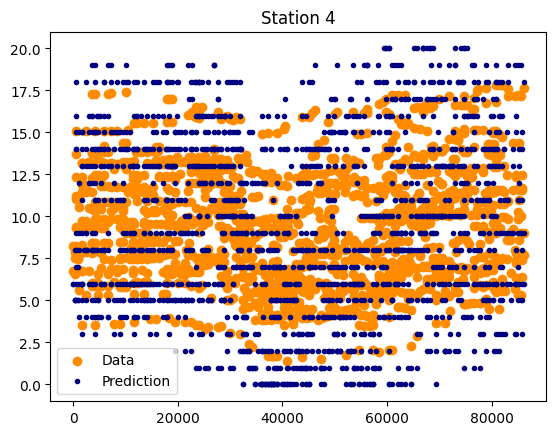

0.8315250345367688
11.494252873563218
<class 'pandas.core.frame.DataFrame'> 2088 2088


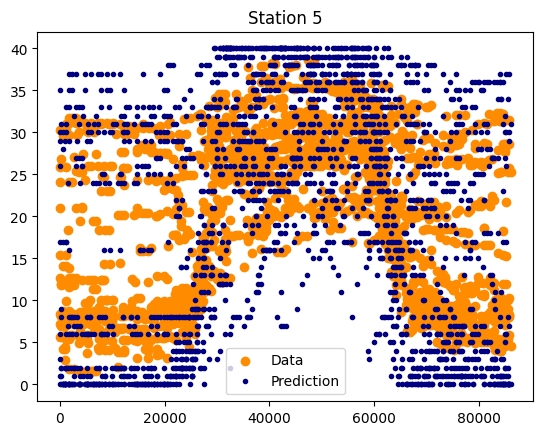

0.8691083488105527
37.06453455168475
<class 'pandas.core.frame.DataFrame'> 1751 1751


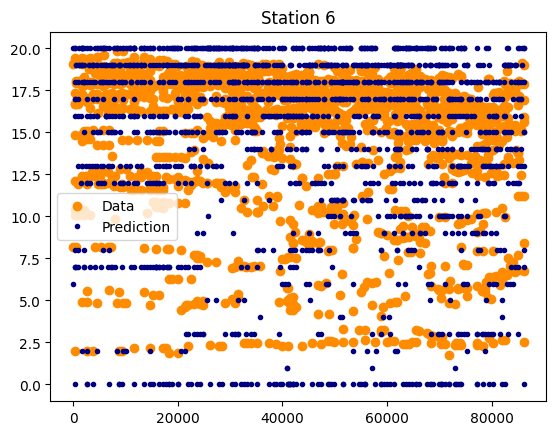

0.7977077374097257
17.97153024911032
<class 'pandas.core.frame.DataFrame'> 1686 1686


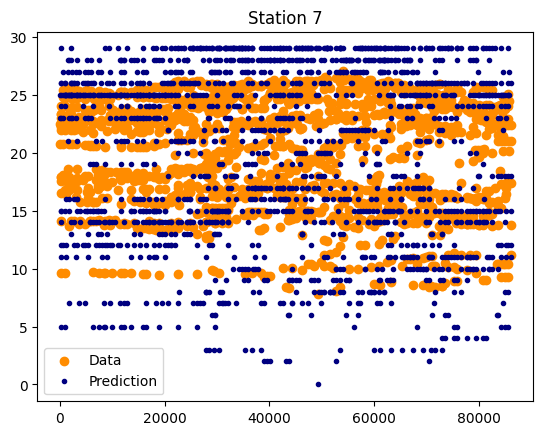

0.7749178587986516
16.33986928104575
<class 'pandas.core.frame.DataFrame'> 1989 1989


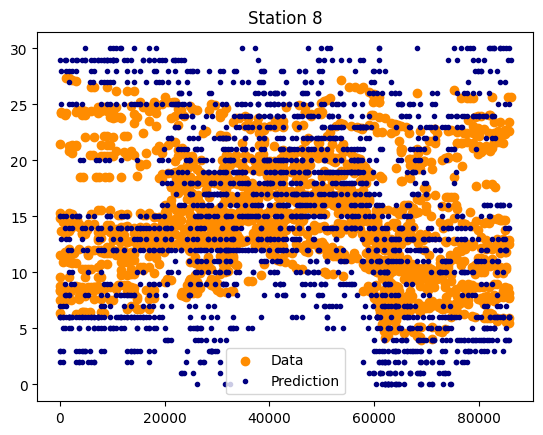

0.7801752903809964
18.69879518072289
<class 'pandas.core.frame.DataFrame'> 2075 2075


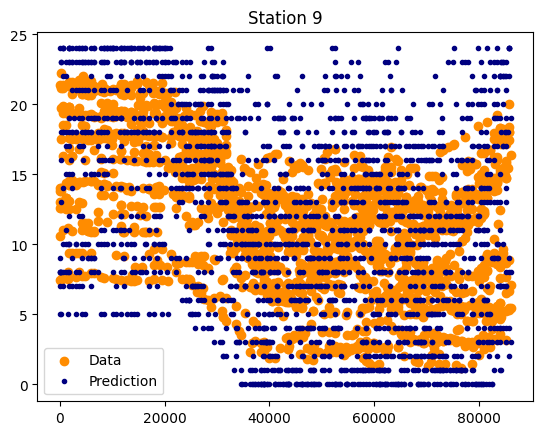

0.7639328821134679
38.71657754010695
<class 'pandas.core.frame.DataFrame'> 1870 1870


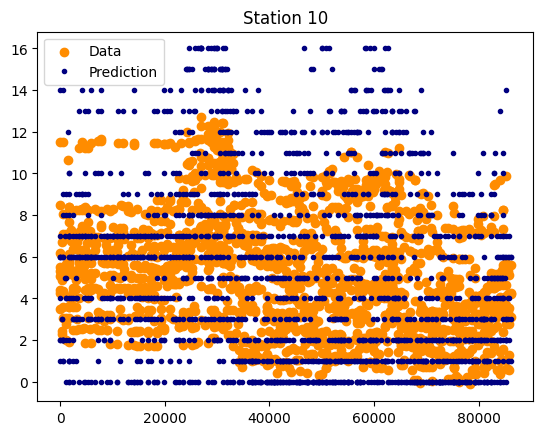

0.8500857355609999
34.56276026174896
<class 'pandas.core.frame.DataFrame'> 1681 1681


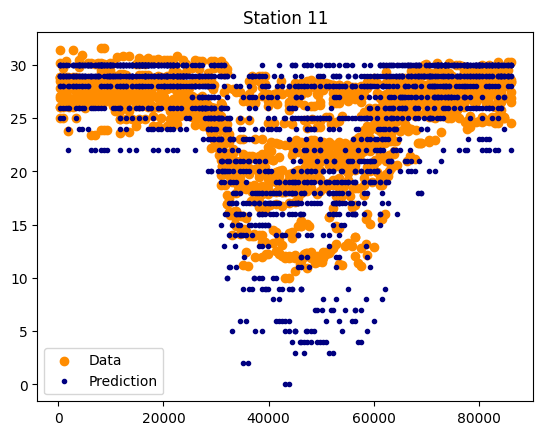

0.8081652329497981
35.45887961859356
<class 'pandas.core.frame.DataFrame'> 1678 1678


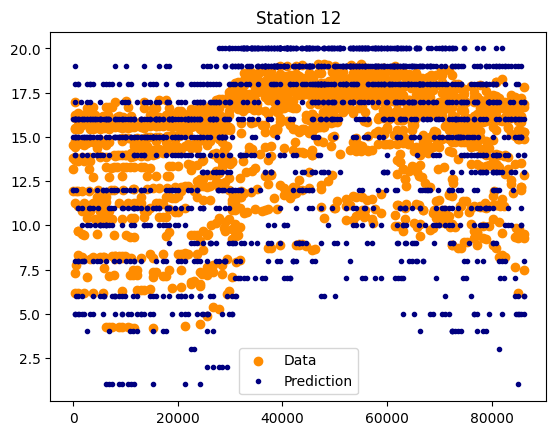

0.8612888887420915
47.03030303030303
<class 'pandas.core.frame.DataFrame'> 1650 1650


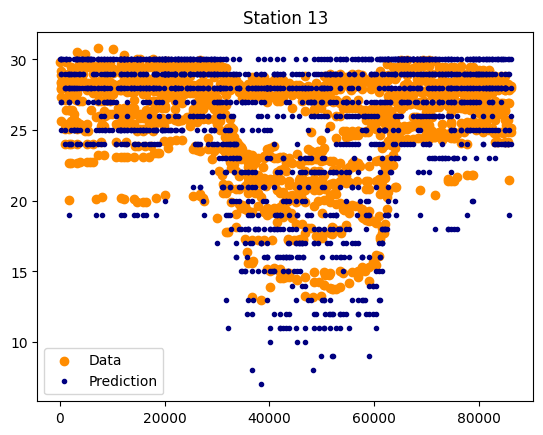

0.7833095245780091
17.2782874617737
<class 'pandas.core.frame.DataFrame'> 1962 1962


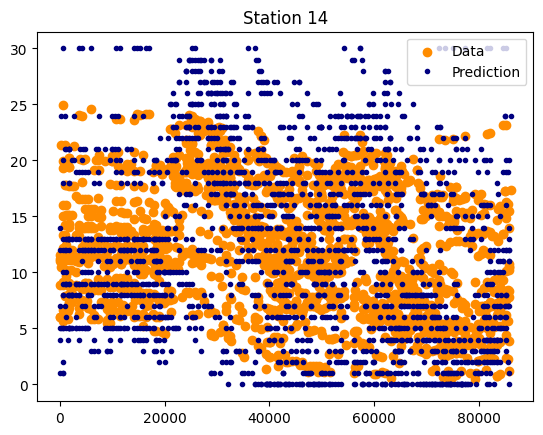

0.7766630845216664
43.889541715628674
<class 'pandas.core.frame.DataFrame'> 1702 1702


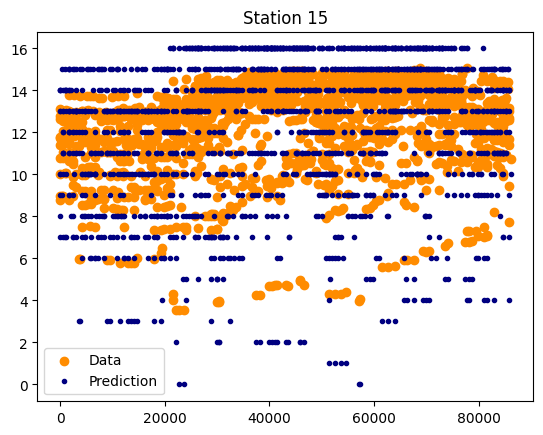

0.7833861221481672
30.4635761589404
<class 'pandas.core.frame.DataFrame'> 1812 1812


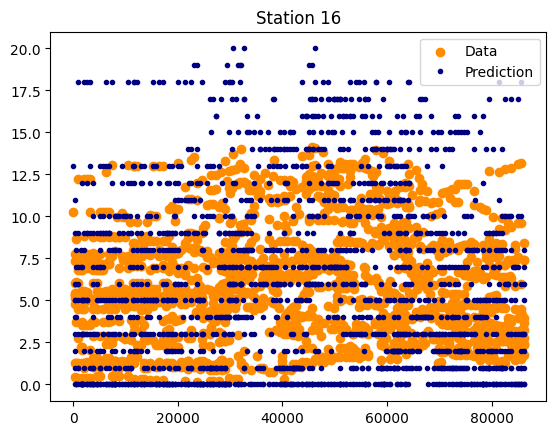

0.8088244735663597
60.55588409225311
<class 'pandas.core.frame.DataFrame'> 1691 1691


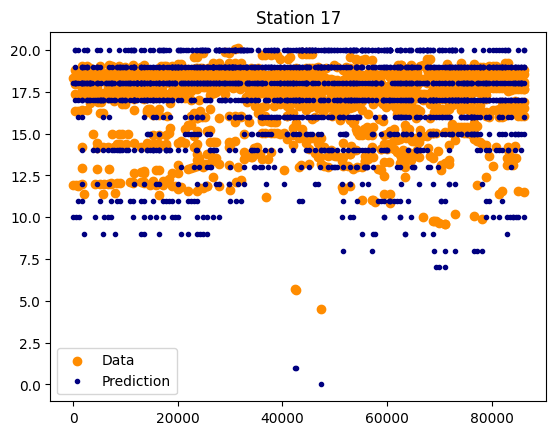

0.7804767311175058
20.53481331987891
<class 'pandas.core.frame.DataFrame'> 1982 1982


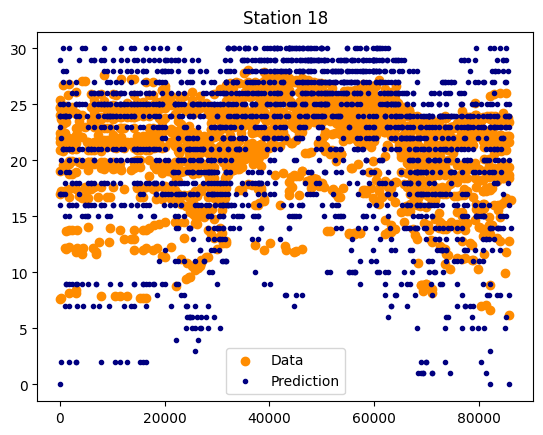

0.8460953002250808
18.78345498783455
<class 'pandas.core.frame.DataFrame'> 2055 2055


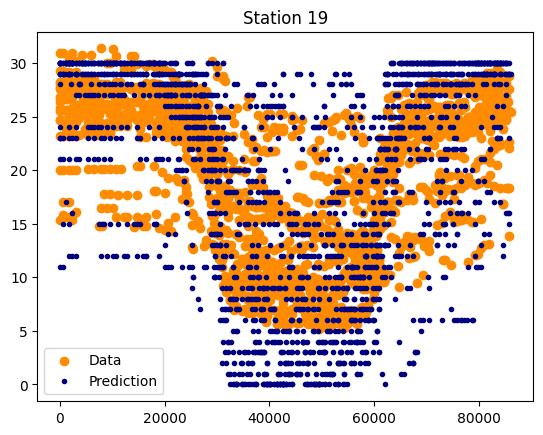

0.8641607370389921
22.64041690793283
<class 'pandas.core.frame.DataFrame'> 1727 1727


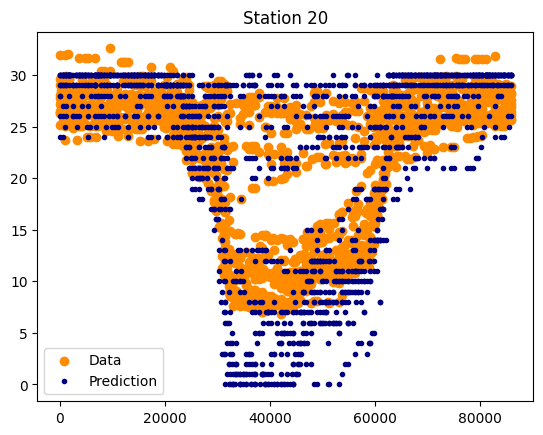

0.8093936473105987
19.696176008381354
<class 'pandas.core.frame.DataFrame'> 1909 1909


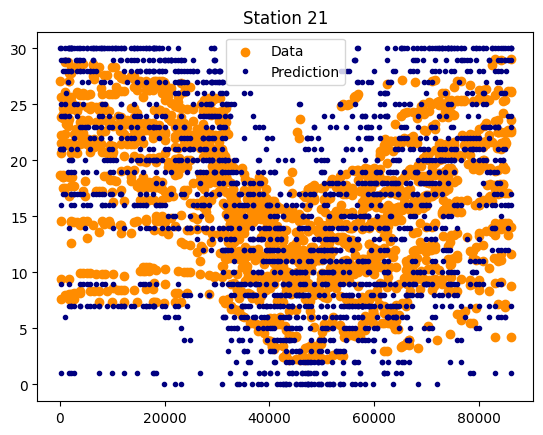

0.7942322478888759
25.295629820051413
<class 'pandas.core.frame.DataFrame'> 1945 1945


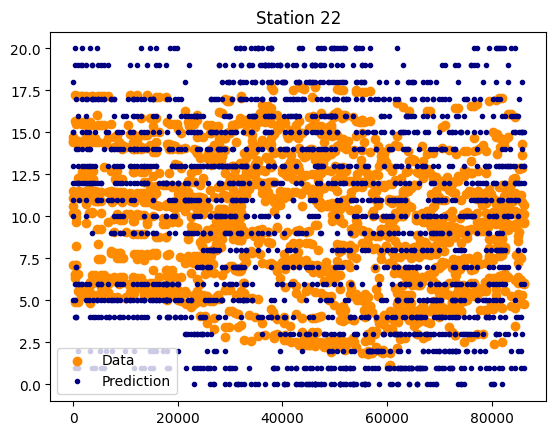

0.7895059329161421
21.951219512195124
<class 'pandas.core.frame.DataFrame'> 1886 1886


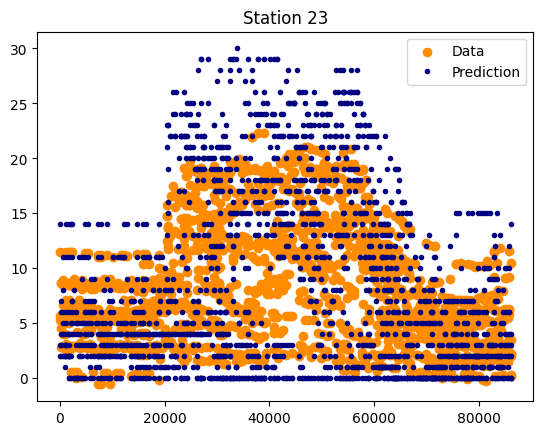

0.7621038929925191
25.02517623363545
<class 'pandas.core.frame.DataFrame'> 1986 1986


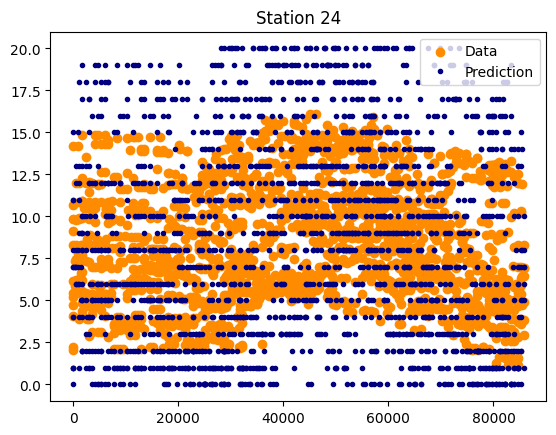

0.866170506481356
27.00348432055749
<class 'pandas.core.frame.DataFrame'> 1722 1722


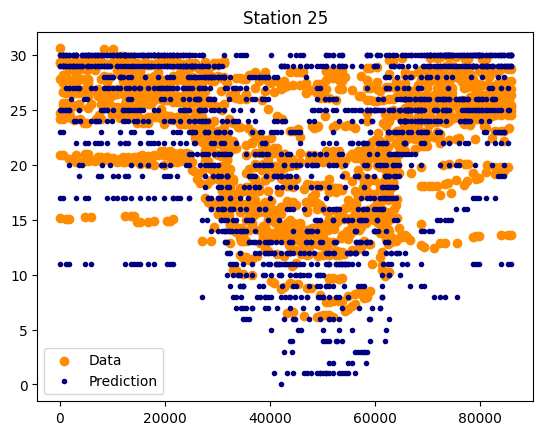

0.8423606431004551
29.372570794003334
<class 'pandas.core.frame.DataFrame'> 1801 1801


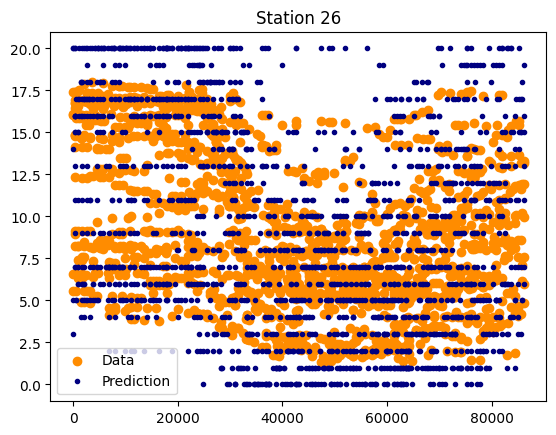

0.8530685593581762
34.25679275439531
<class 'pandas.core.frame.DataFrame'> 1877 1877


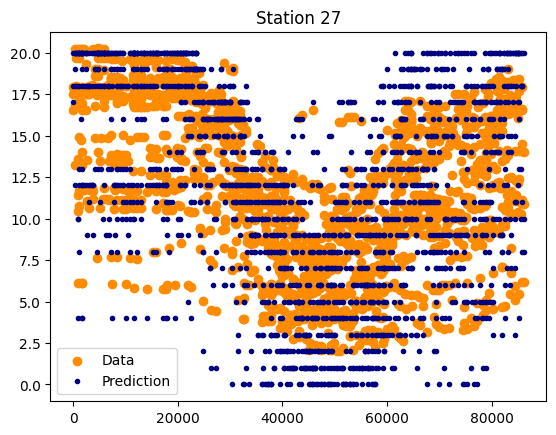

0.7175741223237073
17.505470459518598
<class 'pandas.core.frame.DataFrame'> 1828 1828


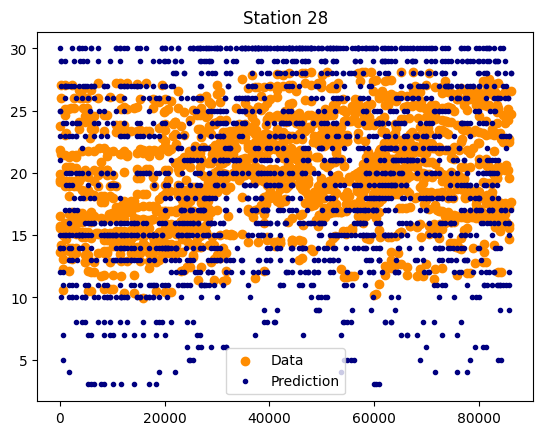

0.8064441030177614
18.548387096774192
<class 'pandas.core.frame.DataFrame'> 1984 1984


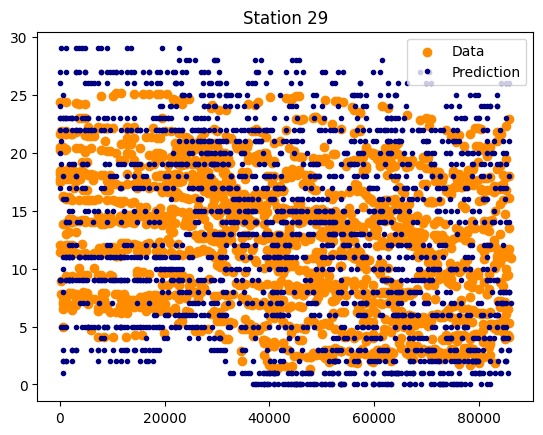

0.8279844113244624
49.40736119775421
<class 'pandas.core.frame.DataFrame'> 1603 1603


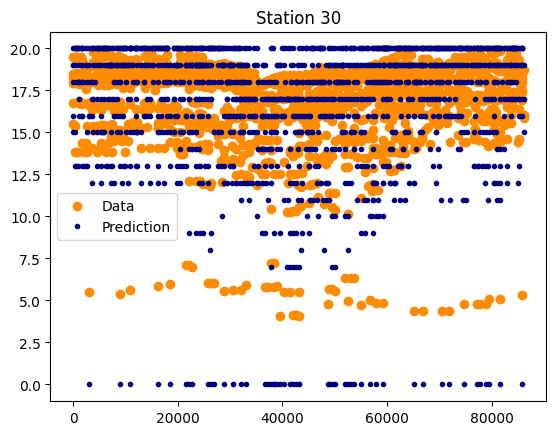

0.7055974696059046
22.828913156526262
<class 'pandas.core.frame.DataFrame'> 1923 1923


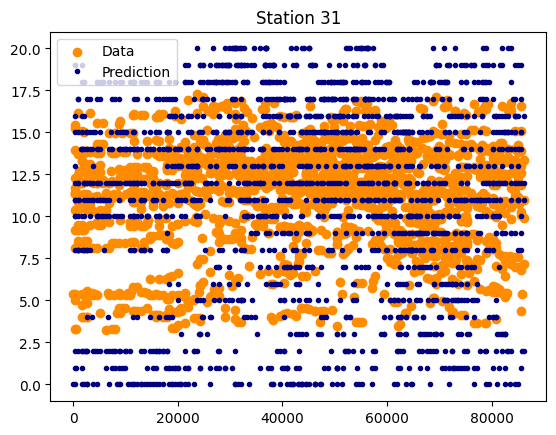

0.7491514455409718
19.622454048683558
<class 'pandas.core.frame.DataFrame'> 2013 2013


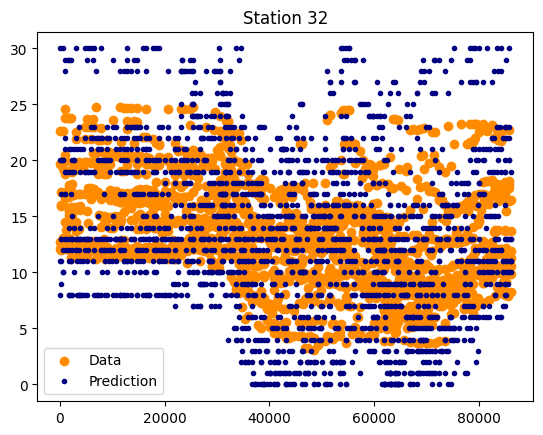

0.659599926985159
19.89676208352886
<class 'pandas.core.frame.DataFrame'> 2131 2131


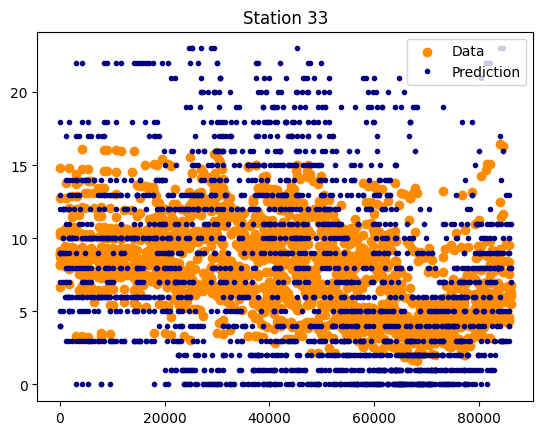

0.8274856046352104
15.998066698888353
<class 'pandas.core.frame.DataFrame'> 2069 2069


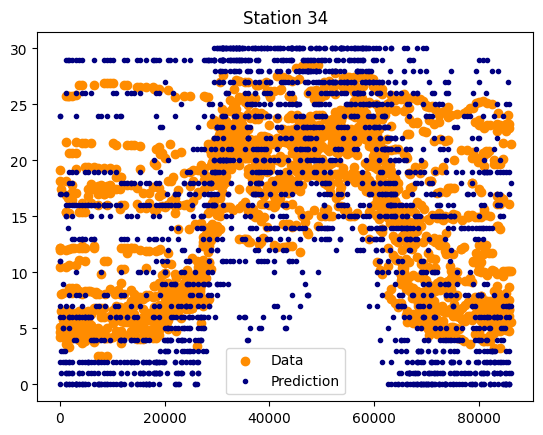

0.8612429106100024
21.792890262751158
<class 'pandas.core.frame.DataFrame'> 1941 1941


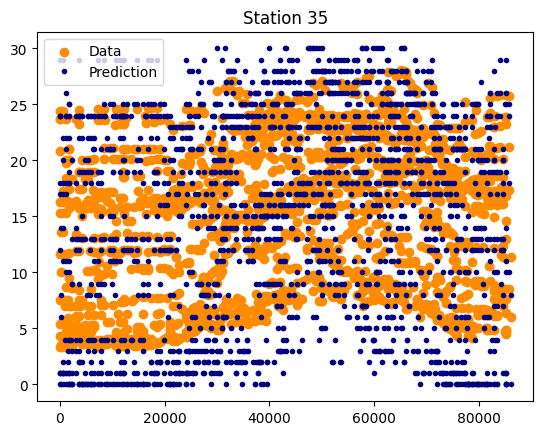

0.7998560205989148
22.86670384829894
<class 'pandas.core.frame.DataFrame'> 1793 1793


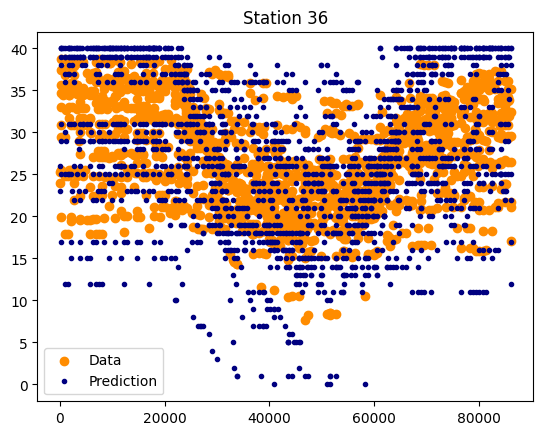

0.8671369027308288
45.66831683168317
<class 'pandas.core.frame.DataFrame'> 1616 1616


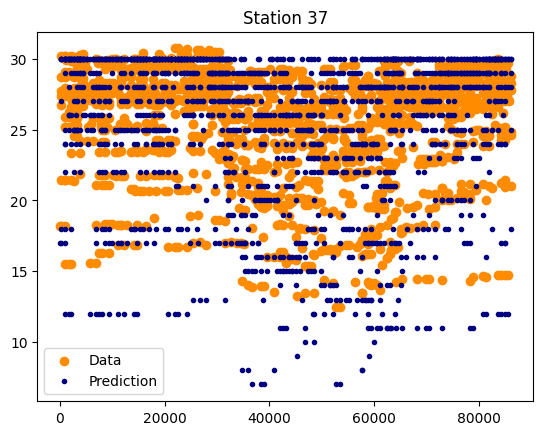

0.8100729505085443
18.697993147332355
<class 'pandas.core.frame.DataFrame'> 2043 2043


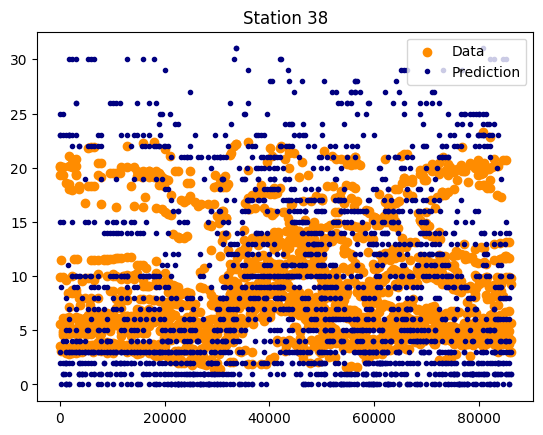

0.726075139101966
37.295081967213115
<class 'pandas.core.frame.DataFrame'> 1952 1952


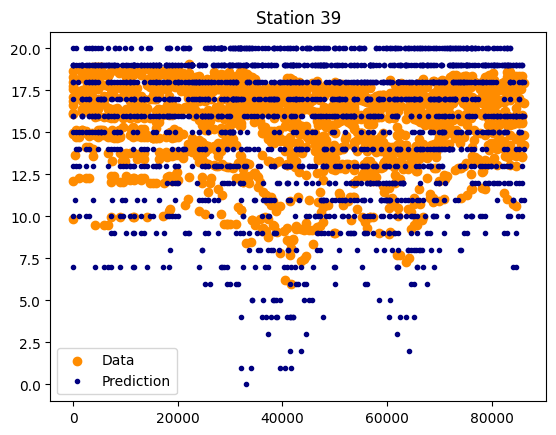

0.7635115947208864
23.718964606444796
<class 'pandas.core.frame.DataFrame'> 1893 1893


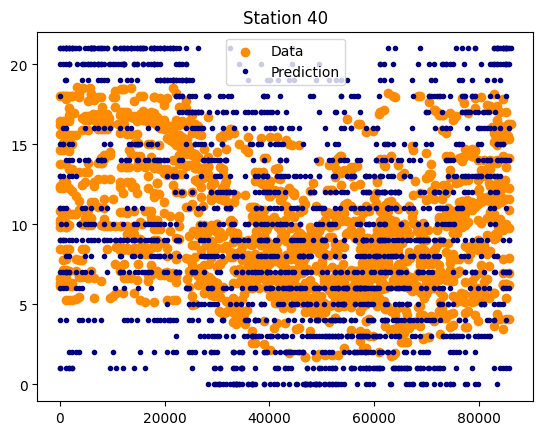

0.8135238631209423
29.356172474896635
<class 'pandas.core.frame.DataFrame'> 1693 1693


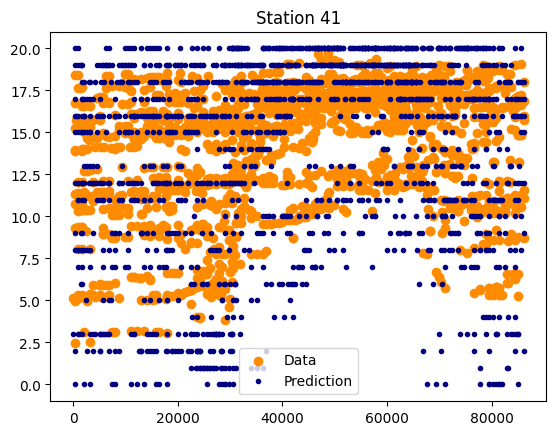

0.8727209103332927
26.135163674762406
<class 'pandas.core.frame.DataFrame'> 1894 1894


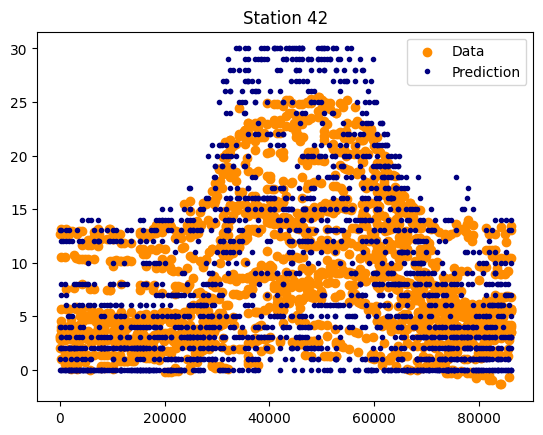

0.8477485126227712
17.59259259259259
<class 'pandas.core.frame.DataFrame'> 1836 1836


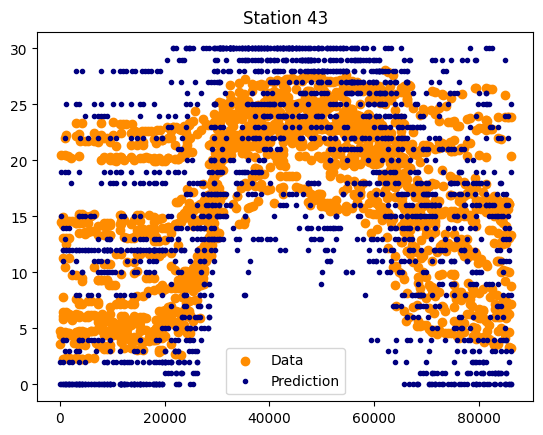

0.882511379127899
31.125071387778412
<class 'pandas.core.frame.DataFrame'> 1751 1751


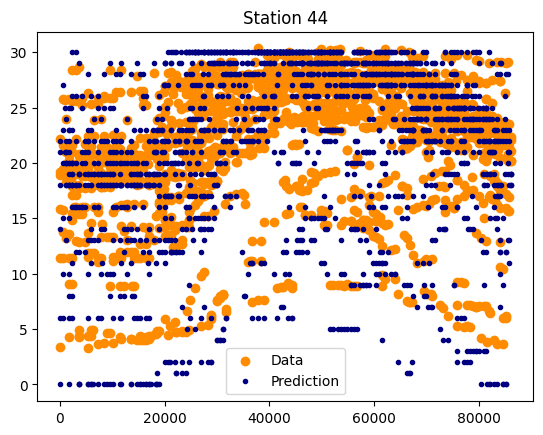

0.844678333115466
21.157118547929667
<class 'pandas.core.frame.DataFrame'> 1763 1763


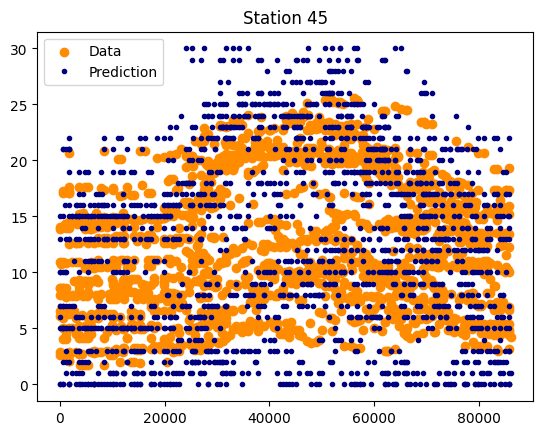

0.8552616883572929
40.43452021726011
<class 'pandas.core.frame.DataFrame'> 1657 1657


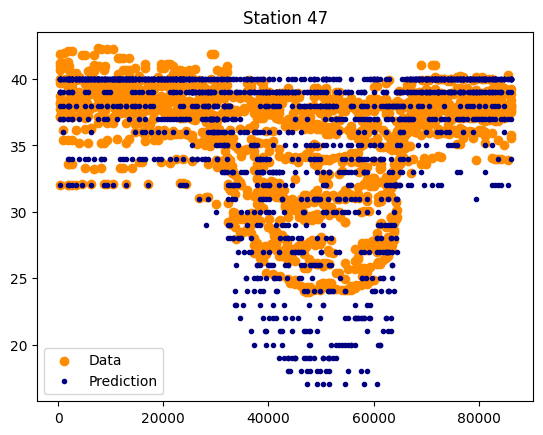

0.8466462864790059
18.875067604110328
<class 'pandas.core.frame.DataFrame'> 1849 1849


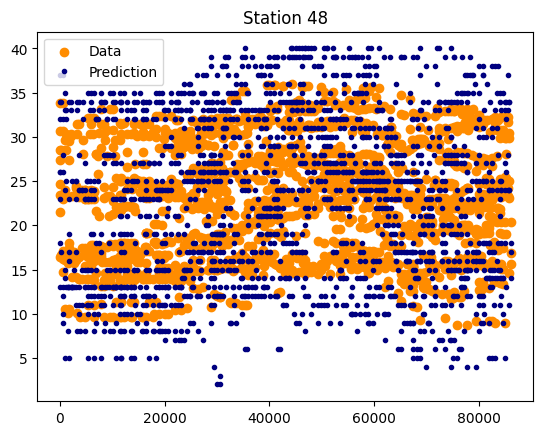

0.8573203425793952
17.582417582417584
<class 'pandas.core.frame.DataFrame'> 2002 2002


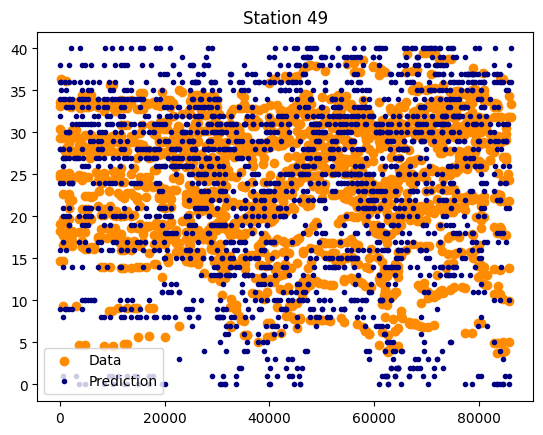

0.8954394496990884
16.04747162022704
<class 'pandas.core.frame.DataFrame'> 1938 1938


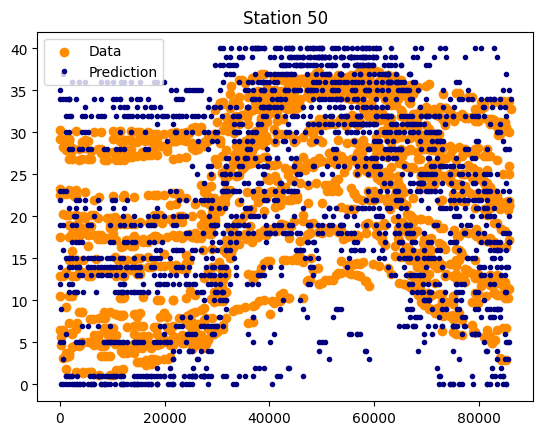

0.8955118356830714
35.06187389510902
<class 'pandas.core.frame.DataFrame'> 1697 1697


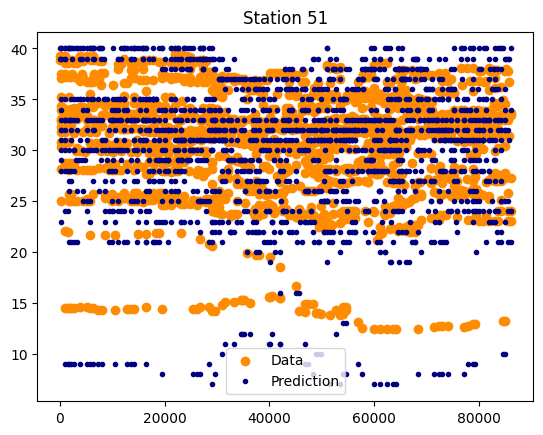

0.9087408440347016
27.044025157232703
<class 'pandas.core.frame.DataFrame'> 1590 1590


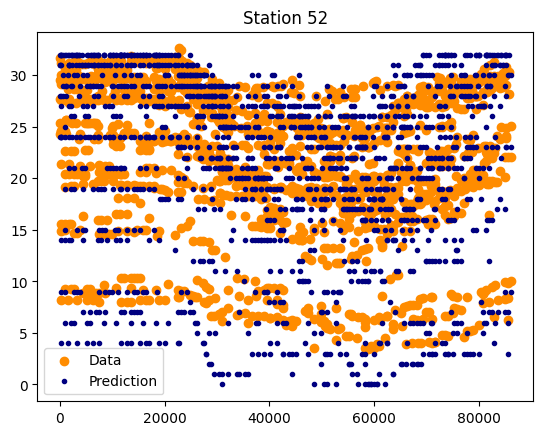

0.8585869720345332
33.1875
<class 'pandas.core.frame.DataFrame'> 1600 1600


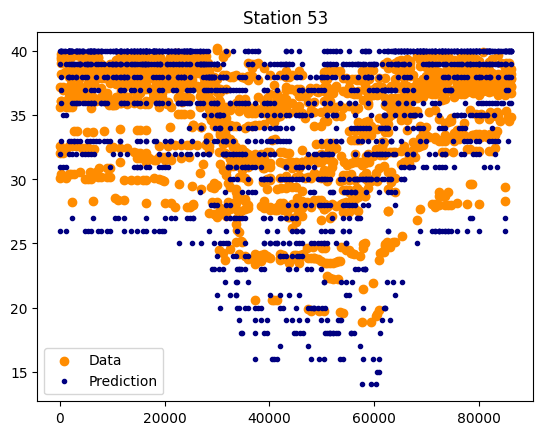

0.8760350655985361
31.43521208599651
<class 'pandas.core.frame.DataFrame'> 1721 1721


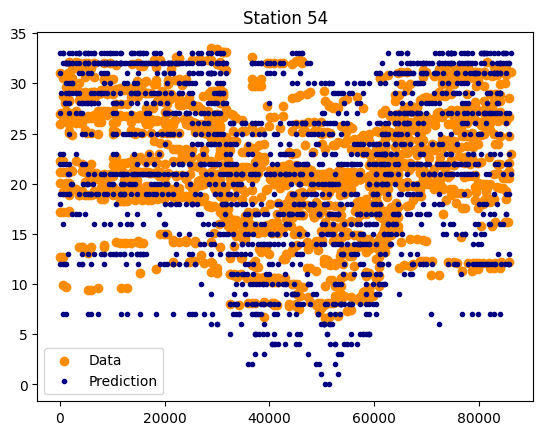

0.8755234461830572
28.861061419200958
<class 'pandas.core.frame.DataFrame'> 1677 1677


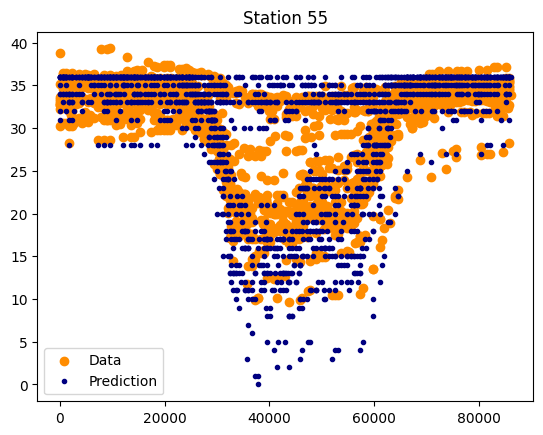

0.8327869911507424
15.83803177857509
<class 'pandas.core.frame.DataFrame'> 1951 1951


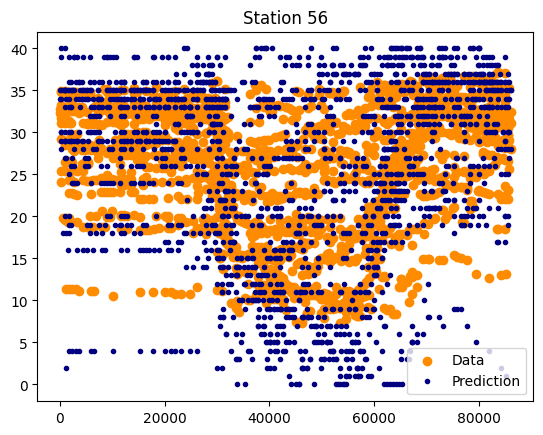

0.8501873053998328
30.13048635824436
<class 'pandas.core.frame.DataFrame'> 1686 1686


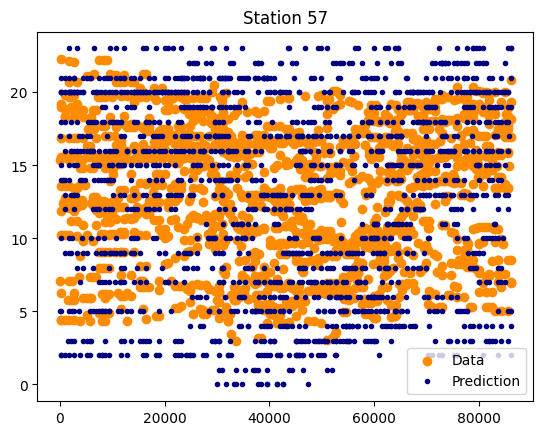

0.8137912529610384
20.73288331726133
<class 'pandas.core.frame.DataFrame'> 2074 2074


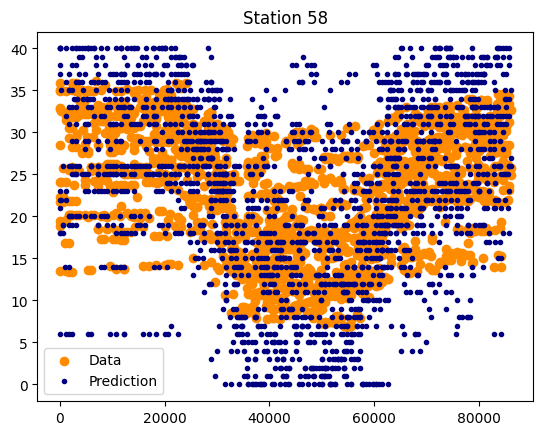

0.8043730684052957
41.58767772511848
<class 'pandas.core.frame.DataFrame'> 1688 1688


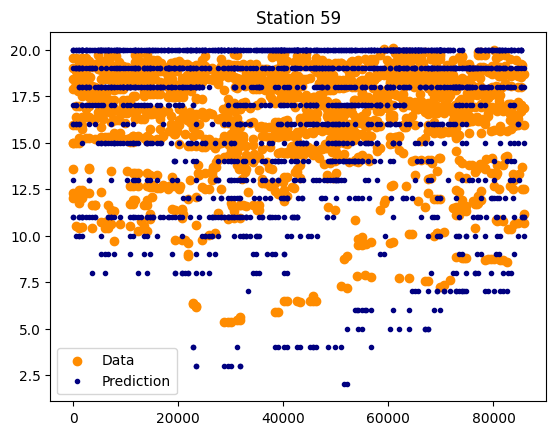

0.8555706252678013
22.37113402061856
<class 'pandas.core.frame.DataFrame'> 1940 1940


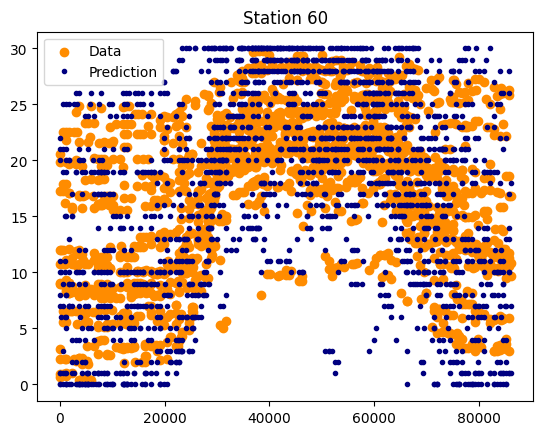

0.7951521520156913
30.525030525030527
<class 'pandas.core.frame.DataFrame'> 1638 1638


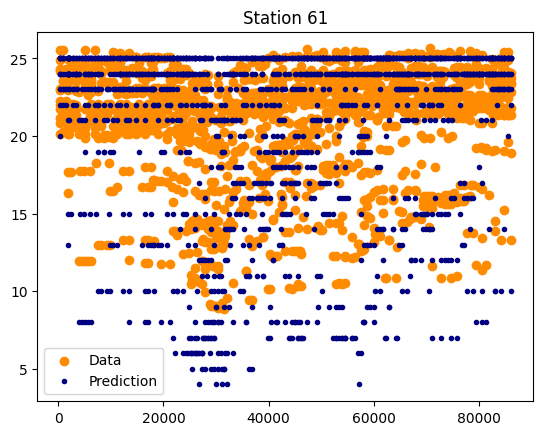

0.8635686048056219
24.79740680713128
<class 'pandas.core.frame.DataFrame'> 1851 1851


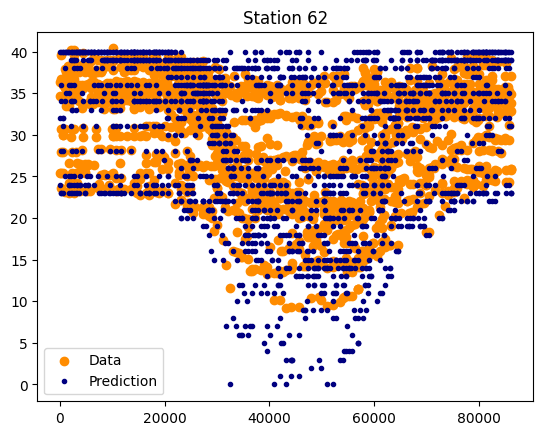

0.8727394565098167
35.62255723059743
<class 'pandas.core.frame.DataFrame'> 1791 1791


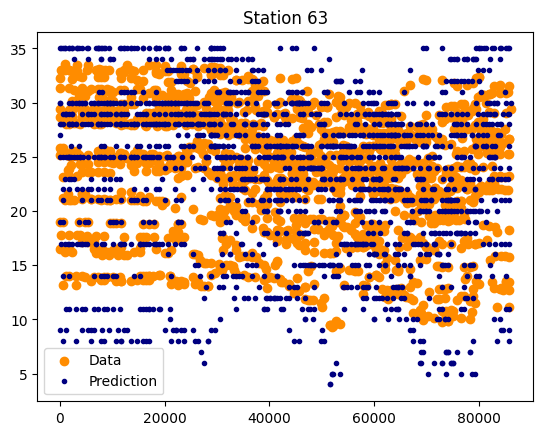

0.8498045211549841
22.326551904016693
<class 'pandas.core.frame.DataFrame'> 1917 1917


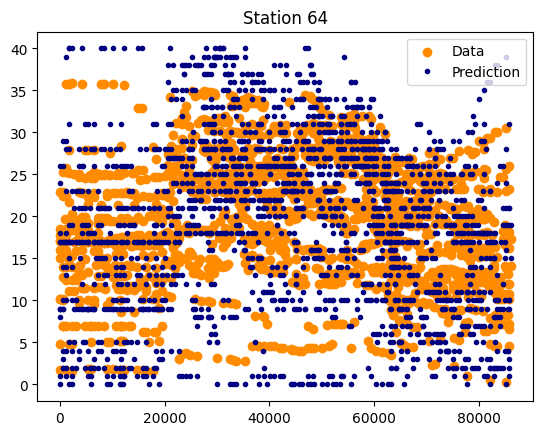

0.8597739169106333
17.515151515151516
<class 'pandas.core.frame.DataFrame'> 1650 1650


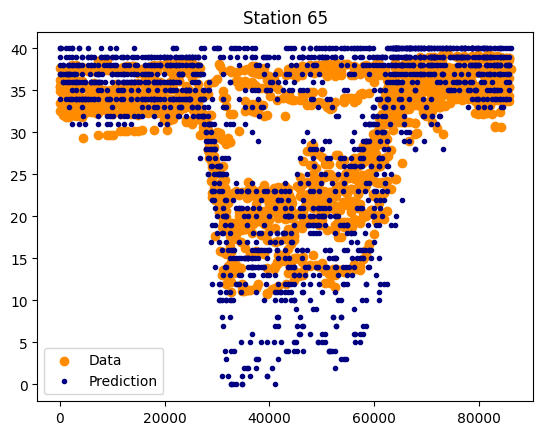

0.7973877264382322
18.34319526627219
<class 'pandas.core.frame.DataFrame'> 1859 1859


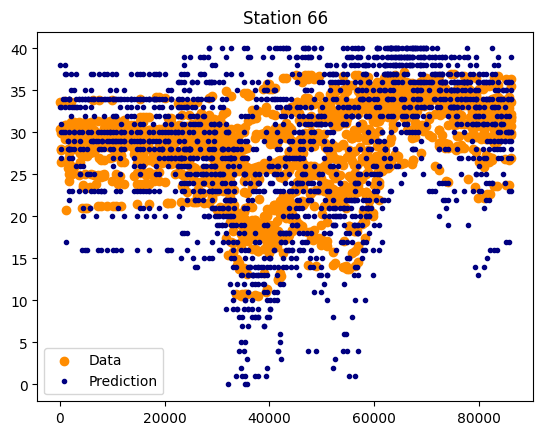

0.8294540765393698
19.980069755854508
<class 'pandas.core.frame.DataFrame'> 2007 2007


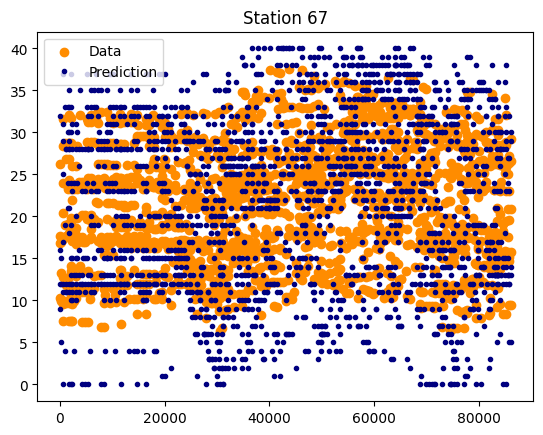

0.8505010213506587
16.344725111441306
<class 'pandas.core.frame.DataFrame'> 2019 2019


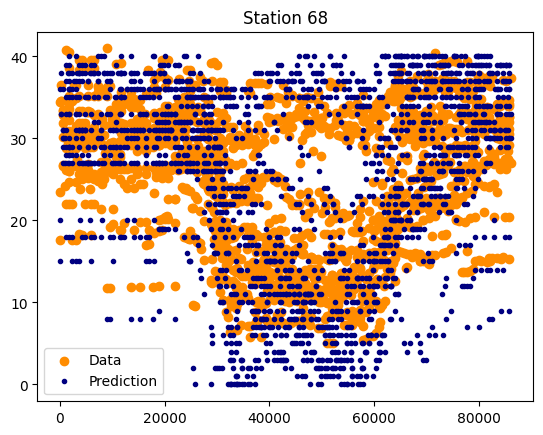

0.8427366149091893
16.051578479324142
<class 'pandas.core.frame.DataFrame'> 2249 2249


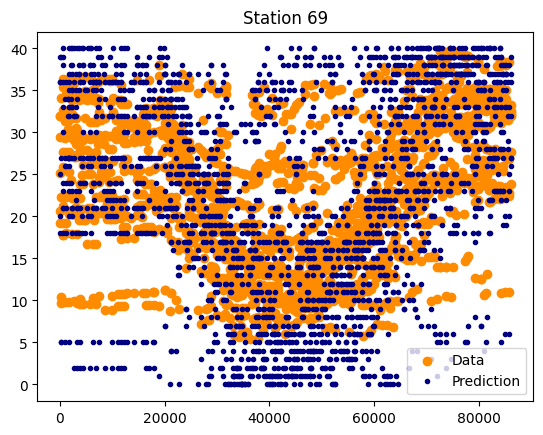

0.8736807563421538
33.99778516057586
<class 'pandas.core.frame.DataFrame'> 1806 1806


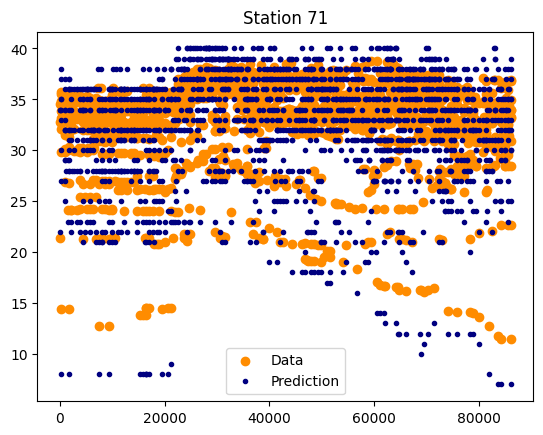

0.7579220344072669
27.313769751693002
<class 'pandas.core.frame.DataFrame'> 1772 1772


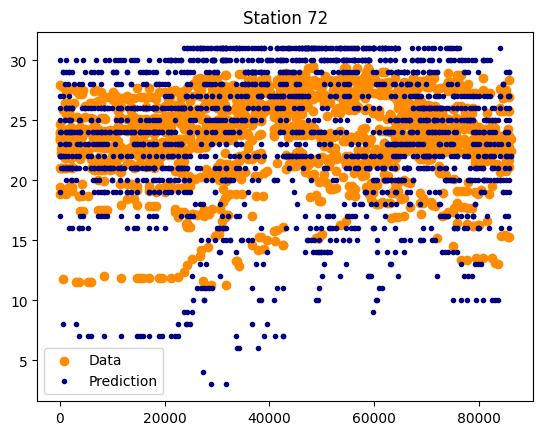

0.8154482076093049
30.665224445646295
<class 'pandas.core.frame.DataFrame'> 1849 1849


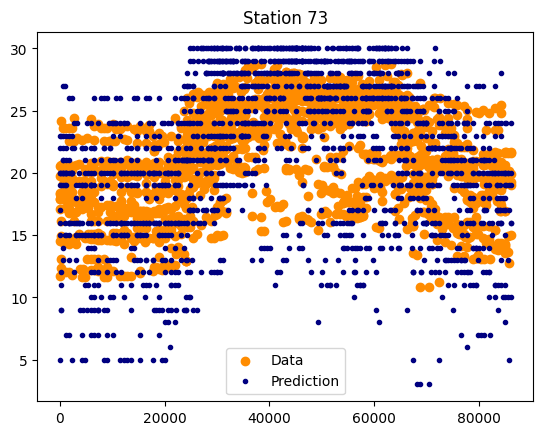

0.8447734332990862
21.85163887291547
<class 'pandas.core.frame.DataFrame'> 1739 1739


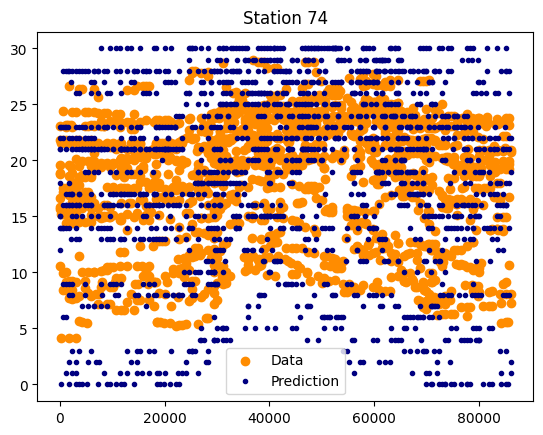

0.8071042903212418
21.341463414634145
<class 'pandas.core.frame.DataFrame'> 1804 1804


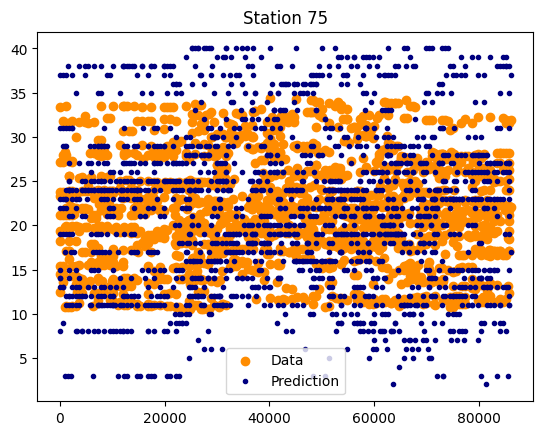

0.7694764618784424
21.93698949824971
<class 'pandas.core.frame.DataFrame'> 1714 1714


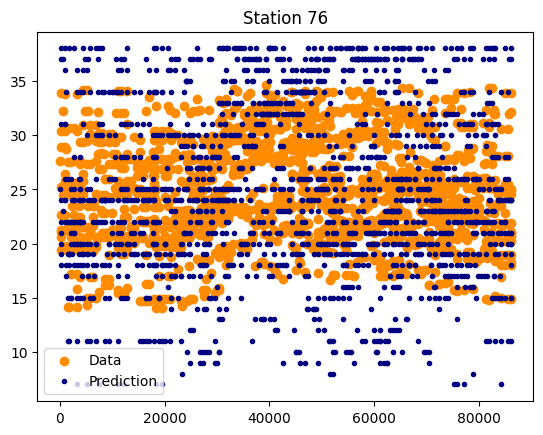

0.8678516627277449
25.780409041980622
<class 'pandas.core.frame.DataFrame'> 1858 1858


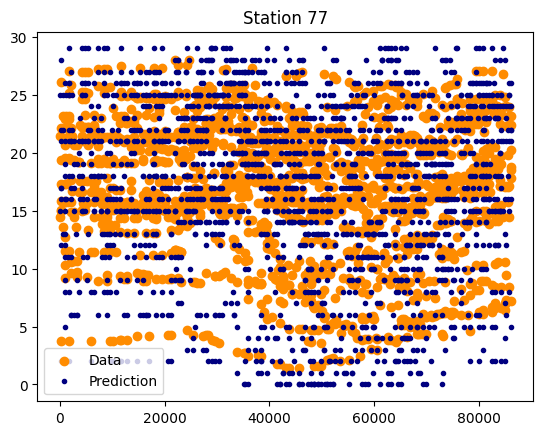

0.8862372006327329
27.288329519450798
<class 'pandas.core.frame.DataFrame'> 1748 1748


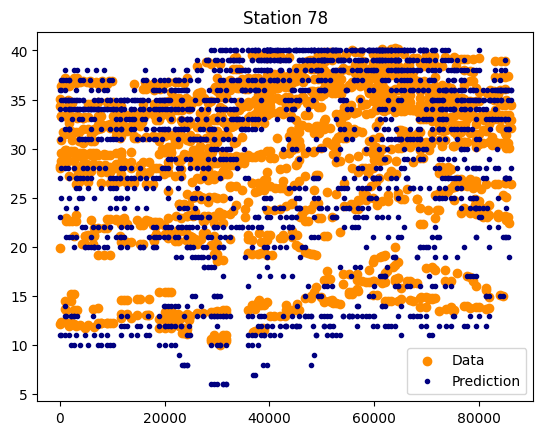

0.8373408497829522
46.31043256997455
<class 'pandas.core.frame.DataFrame'> 1572 1572


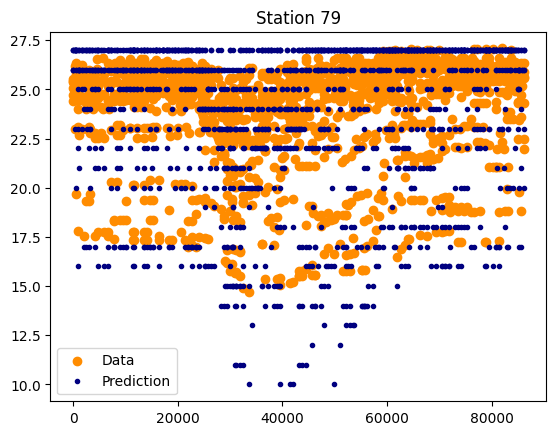

0.7387784026532038
21.860730593607304
<class 'pandas.core.frame.DataFrame'> 1752 1752


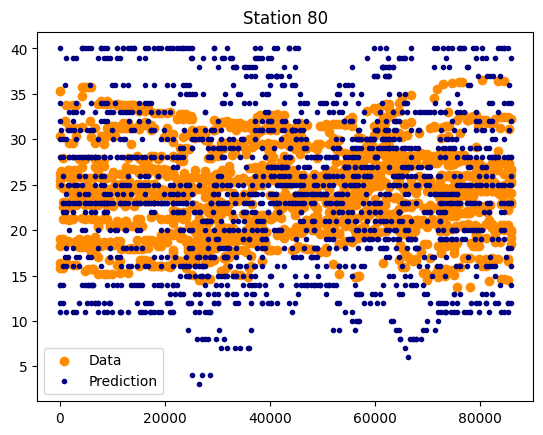

0.8736572593256042
31.13735239279055
<class 'pandas.core.frame.DataFrame'> 1609 1609


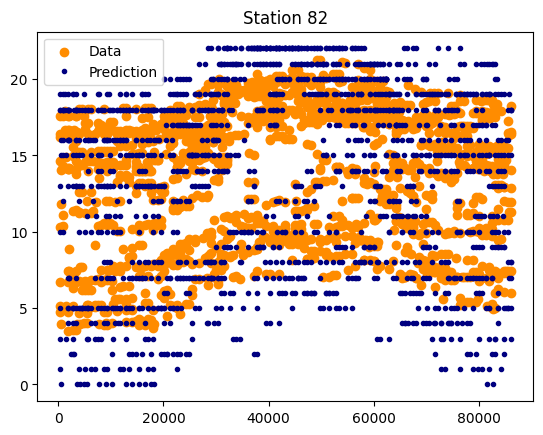

0.8562932007418295
25.430539609644086
<class 'pandas.core.frame.DataFrame'> 1742 1742


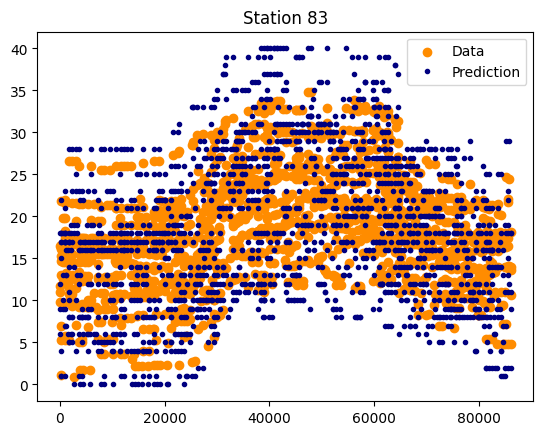

0.8647379533454269
28.700906344410875
<class 'pandas.core.frame.DataFrame'> 1655 1655


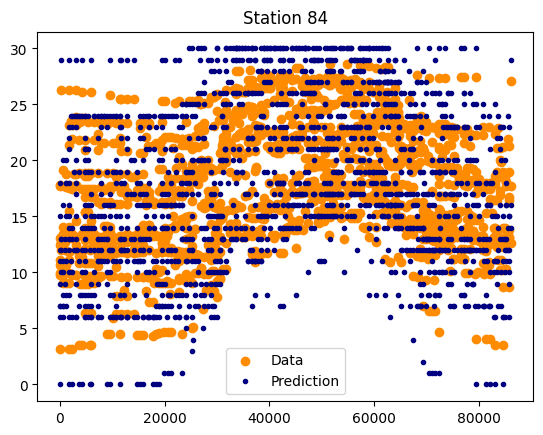

0.8383076055180811
22.022080185938407
<class 'pandas.core.frame.DataFrame'> 1721 1721


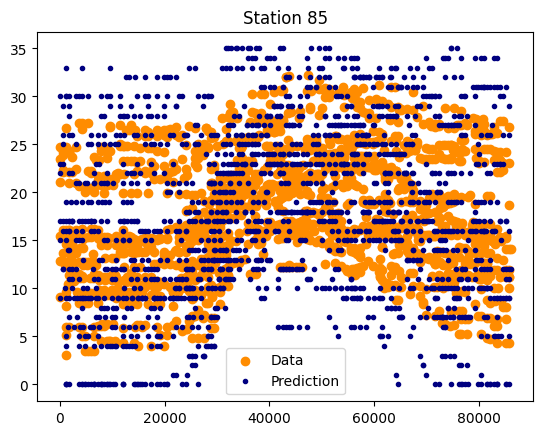

0.8689383547163079
13.70231058570661
<class 'pandas.core.frame.DataFrame'> 1861 1861


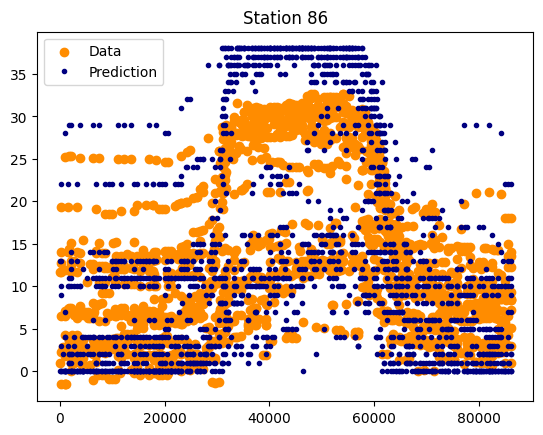

0.8528489580236612
17.91044776119403
<class 'pandas.core.frame.DataFrame'> 1742 1742


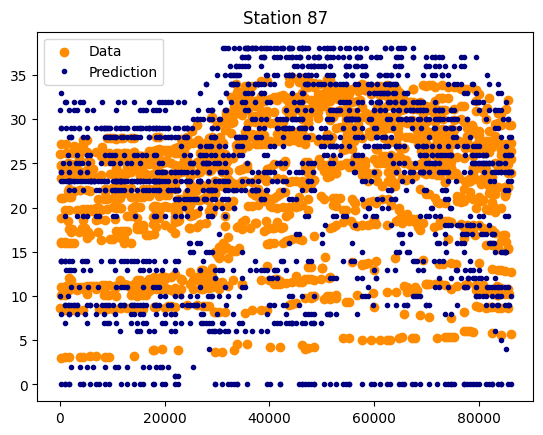

0.8722040180730469
27.957589285714285
<class 'pandas.core.frame.DataFrame'> 1792 1792


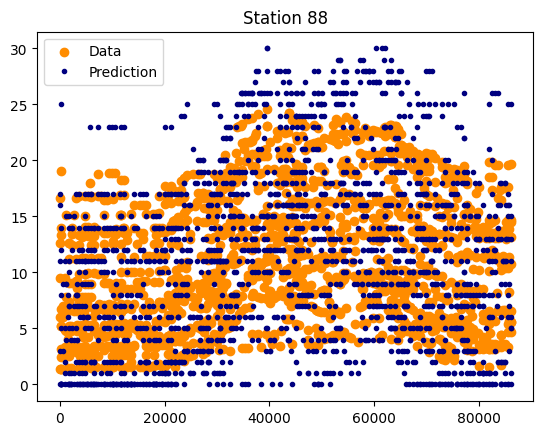

0.844919049887574
48.38709677419355
<class 'pandas.core.frame.DataFrame'> 1612 1612


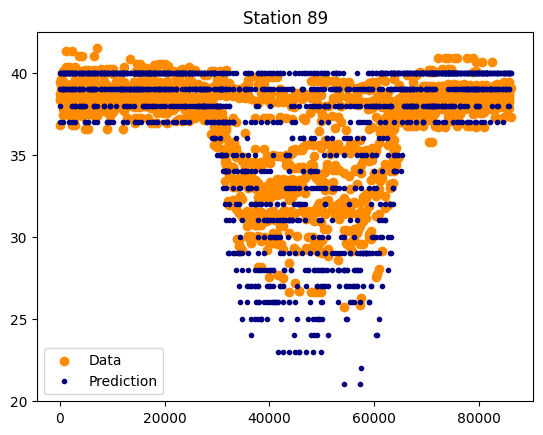

0.8398479650111963
15.43694400837258
<class 'pandas.core.frame.DataFrame'> 1911 1911


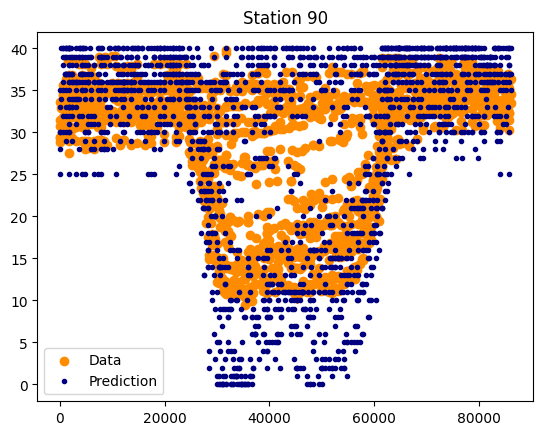

0.789547388325006
17.048853439680958
<class 'pandas.core.frame.DataFrame'> 2006 2006


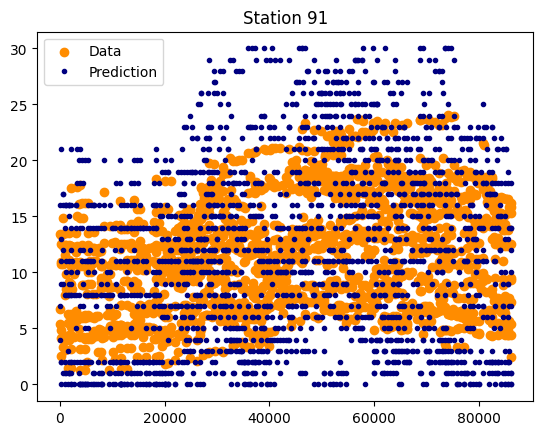

0.86196670656042
15.989010989010987
<class 'pandas.core.frame.DataFrame'> 1820 1820


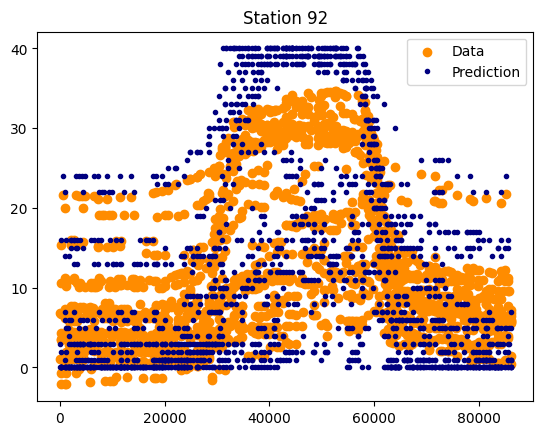

0.8448671216552651
8.132530120481928
<class 'pandas.core.frame.DataFrame'> 1660 1660


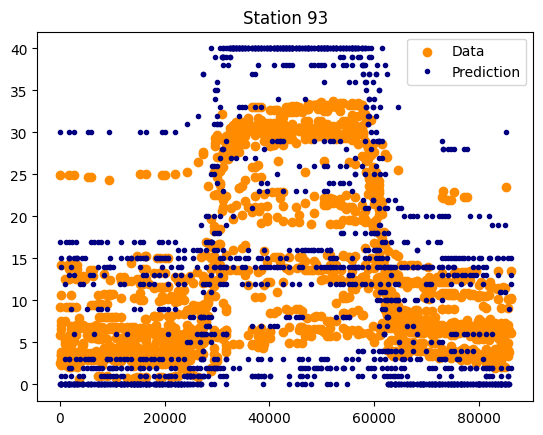

0.8582902289877704
20.037105751391465
<class 'pandas.core.frame.DataFrame'> 1617 1617


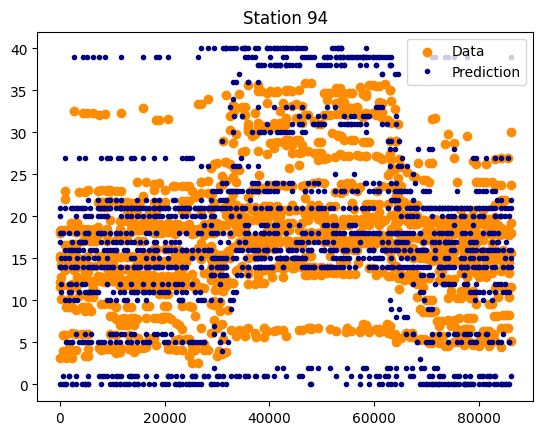

0.8489824836050458
21.315932572050027
<class 'pandas.core.frame.DataFrame'> 1839 1839


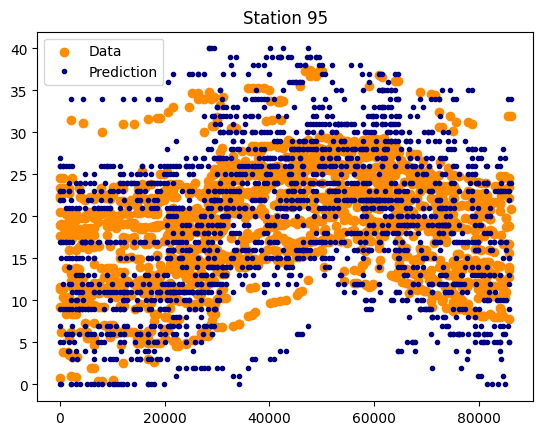

0.8342689546042124
23.492852703542574
<class 'pandas.core.frame.DataFrame'> 1609 1609


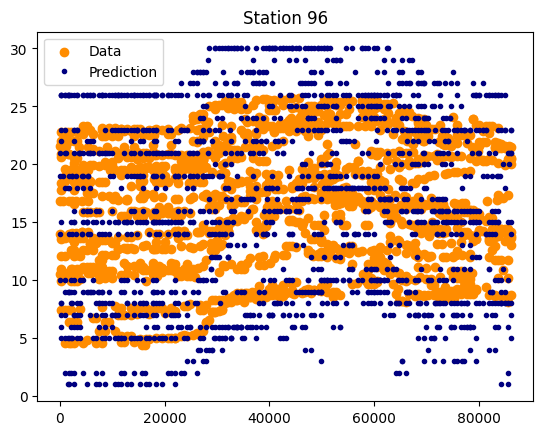

0.7938498840689967
21.49690489589195
<class 'pandas.core.frame.DataFrame'> 1777 1777


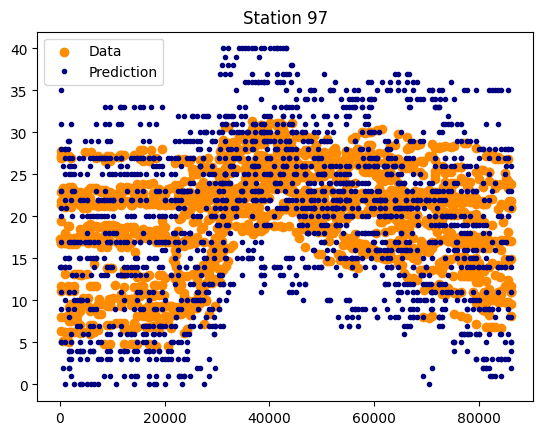

0.892720754442653
20.683661645422944
<class 'pandas.core.frame.DataFrame'> 1726 1726


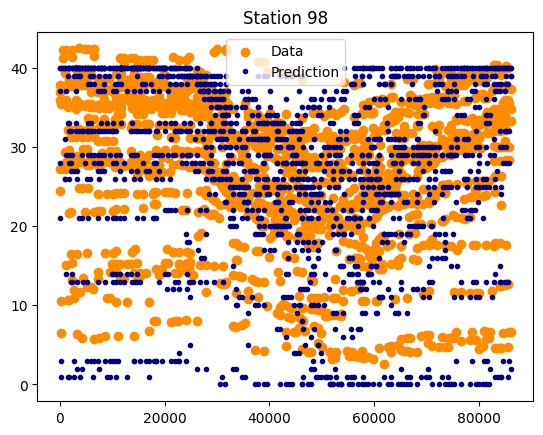

0.8648516201481242
25.217896571760605
<class 'pandas.core.frame.DataFrame'> 1721 1721


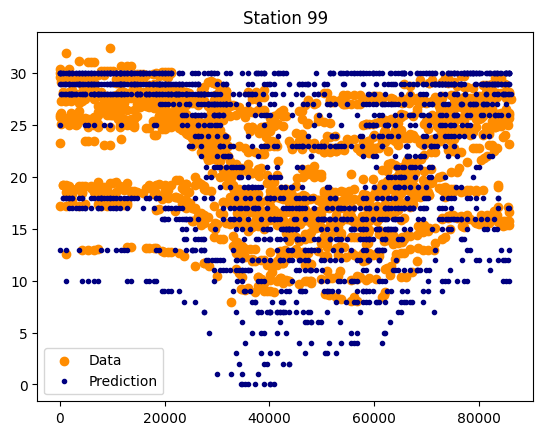

0.8253440865913213
18.426842684268426
<class 'pandas.core.frame.DataFrame'> 1818 1818


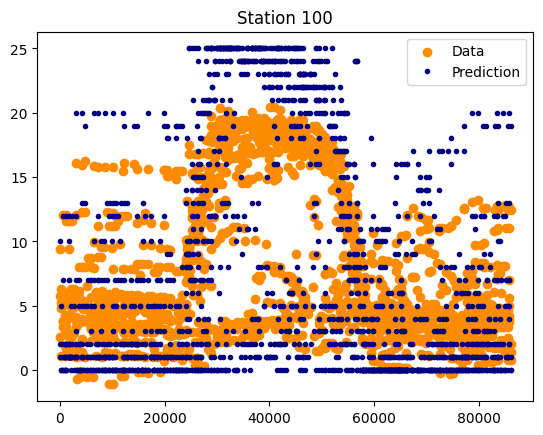

0.8486902342045974
28.68217054263566
<class 'pandas.core.frame.DataFrame'> 1806 1806


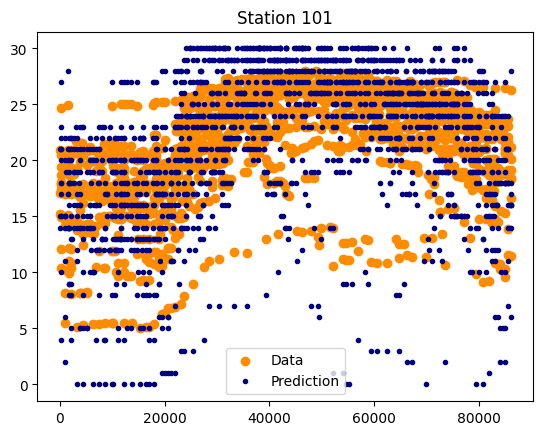

0.7786346275059165
17.37313432835821
<class 'pandas.core.frame.DataFrame'> 1675 1675


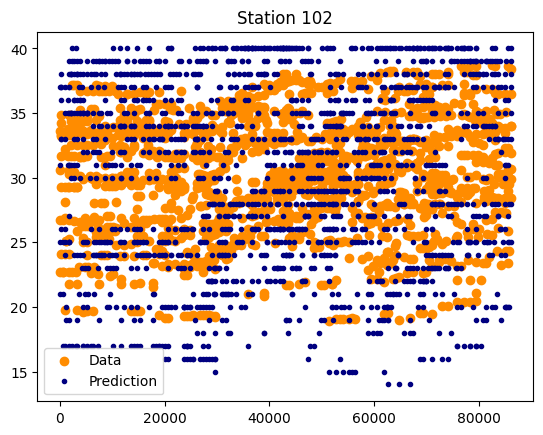

0.8443670968942167
39.769277474195505
<class 'pandas.core.frame.DataFrame'> 1647 1647


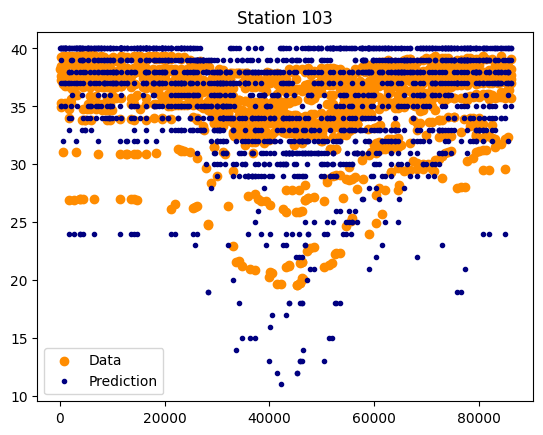

0.8006630812497285
24.88716956802063
<class 'pandas.core.frame.DataFrame'> 1551 1551


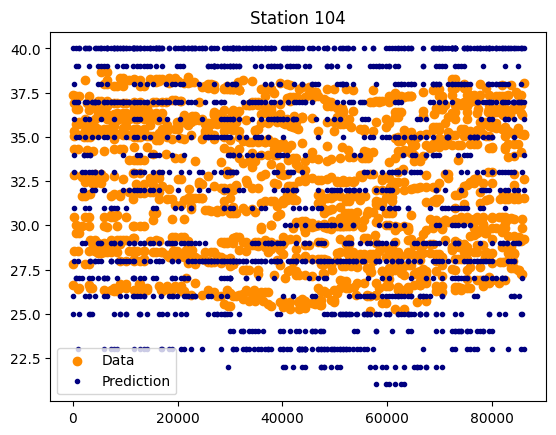

0.8624062659817489
41.62468513853904
<class 'pandas.core.frame.DataFrame'> 1588 1588


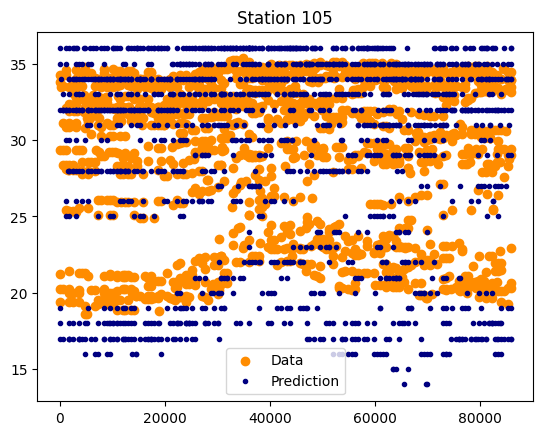

0.7535644249621261
22.42822966507177
<class 'pandas.core.frame.DataFrame'> 1672 1672


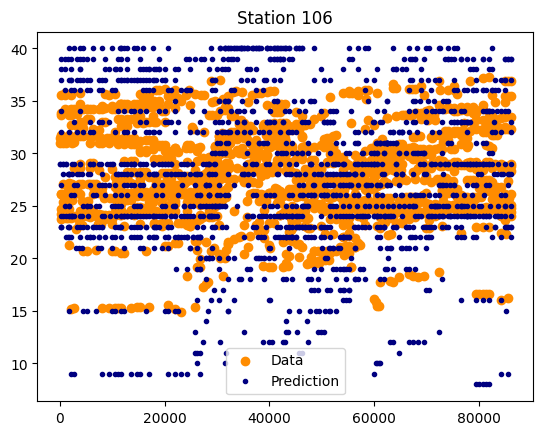

0.8089368416235443
15.055008685581933
<class 'pandas.core.frame.DataFrame'> 1727 1727


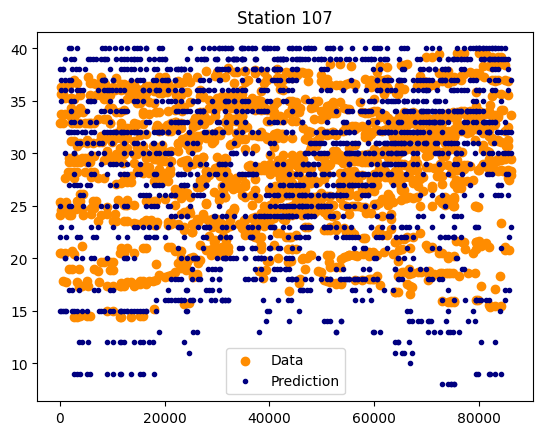

0.797591602861665
20.28985507246377
<class 'pandas.core.frame.DataFrame'> 1725 1725


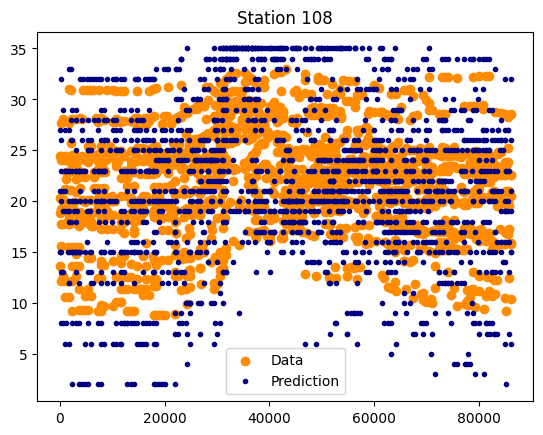

0.8468488794534619
28.216704288939056
<class 'pandas.core.frame.DataFrame'> 1772 1772


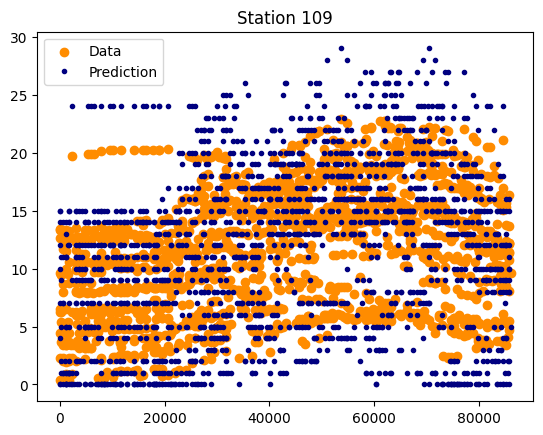

0.8267892790855836
23.666866387058118
<class 'pandas.core.frame.DataFrame'> 1669 1669


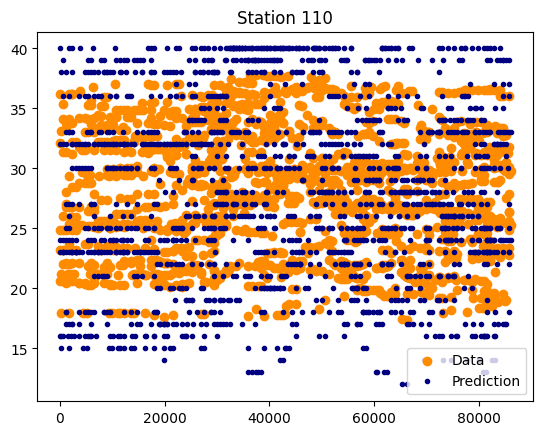

0.8534811308970146
40.44568245125348
<class 'pandas.core.frame.DataFrame'> 1795 1795


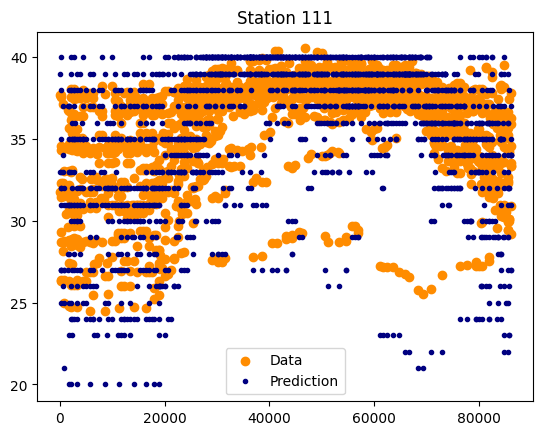

0.8494594262471369
18.078512396694215
<class 'pandas.core.frame.DataFrame'> 1936 1936


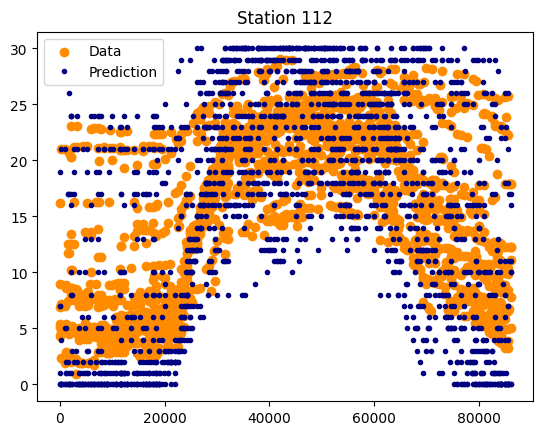

0.8815389576179621
33.93636930754835
<class 'pandas.core.frame.DataFrame'> 1603 1603


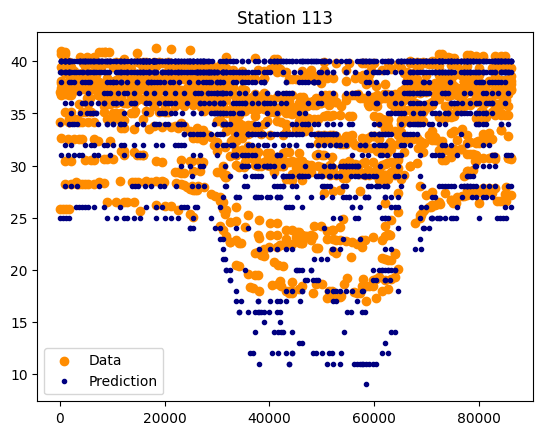

0.8494937520172458
12.740899357601712
<class 'pandas.core.frame.DataFrame'> 1868 1868


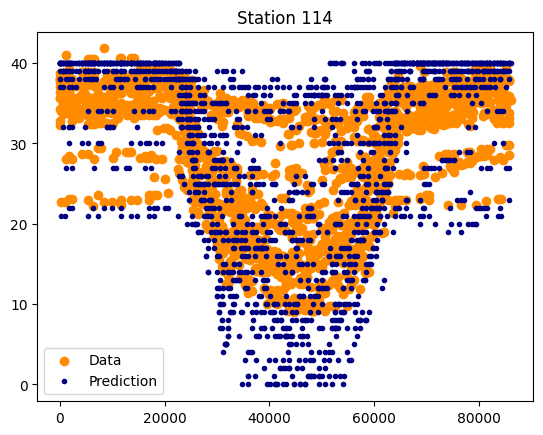

0.865054626599301
23.290488431876607
<class 'pandas.core.frame.DataFrame'> 1945 1945


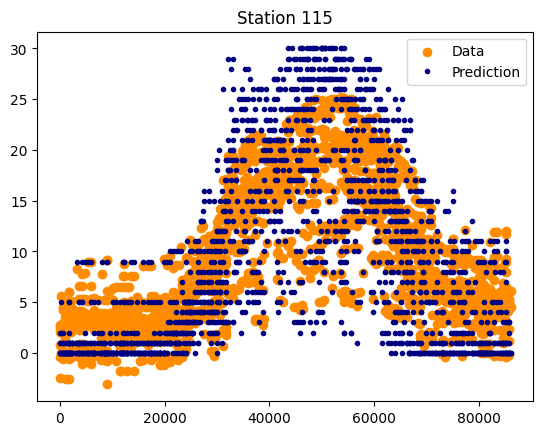

0.8027002186221806
24.22712933753943
<class 'pandas.core.frame.DataFrame'> 1585 1585


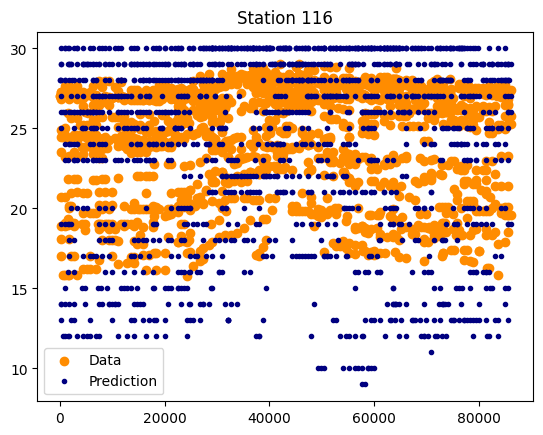

0.8824795877382405
22.022740873728306
<class 'pandas.core.frame.DataFrame'> 1671 1671


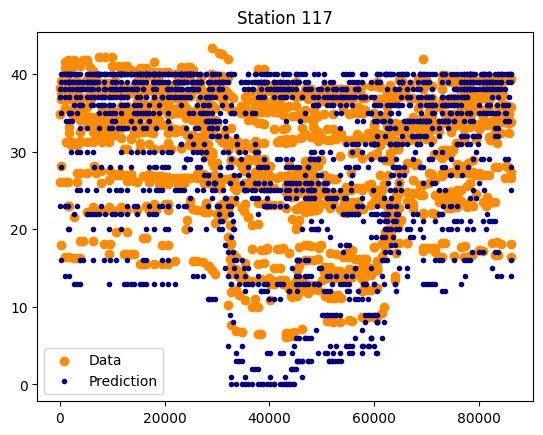

In [19]:
predictions = []
per = []
with PdfPages('RandForeststation_plots.pdf') as pdf:
    for num in station_number:
        x_set_num = x_set.loc[x_set['number'] == num]
        y_set_num = y_set[x_set['number'] == num]
        x_set_num.drop('number',axis=1)
        #scaler = StandardScaler()
        #x_scaled = scaler.fit_transform(x_set_num)
        #print(x_set_num.shape[0])
        highest  = y_set_num.max()
        reg1 = GradientBoostingRegressor(random_state=1)
        reg2 = RandomForestRegressor(random_state=1)
        reg3 = LinearRegression()
        ereg = VotingRegressor(estimators=[('gb', reg1), ('rf', reg2), ('lr', reg3)])

        x_train, x_test, y_train, y_test = train_test_split(x_set_num, y_set_num, test_size=0.33, random_state=42)
        reg = SGDRegressor(max_iter=1000, tol=1e-3)
        ereg = ereg.fit(x_train, y_train)
        y_pred = ereg.predict(x_test)
        #predictions[num] = y_pred
        count = 0
        for i in range(len(y_pred)):
            if abs(y_pred[i] - y_test.iloc[i]) <= 1:
                count += 1
        print(r_squared(y_test, y_pred))
        print(count / len(y_pred) * 100)
        print(type(x_test),y_pred.size,y_test.shape[0])
        per.append(count / len(y_pred) * 100)
        plt.figure()
        plt.scatter(x_test['time_as_fraction'], y_pred, color="darkorange", label="Data")
        plt.plot(x_test['time_as_fraction'], y_test.to_numpy(), 'o', color="navy", label="Prediction", markersize=3)
        plt.axis("tight")
        plt.title(f"Station {num}")
        plt.legend()
        pdf.savefig()
        plt.show()

0.9383308704412343
36.866840731070496
<class 'pandas.core.frame.DataFrame'> 1915 1915
5.6353309363743636


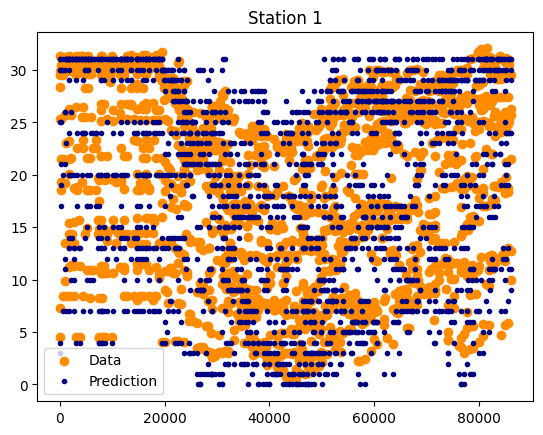

0.9187899391662454
60.76246334310851
<class 'pandas.core.frame.DataFrame'> 1705 1705
1.9705664387197461


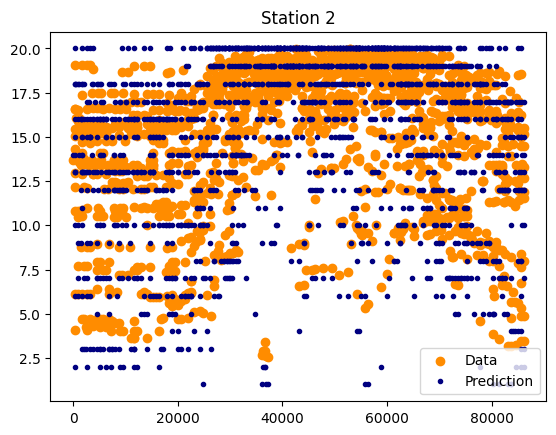

0.9388050344326708
54.66883821932682
<class 'pandas.core.frame.DataFrame'> 1842 1842
2.0328423586017133


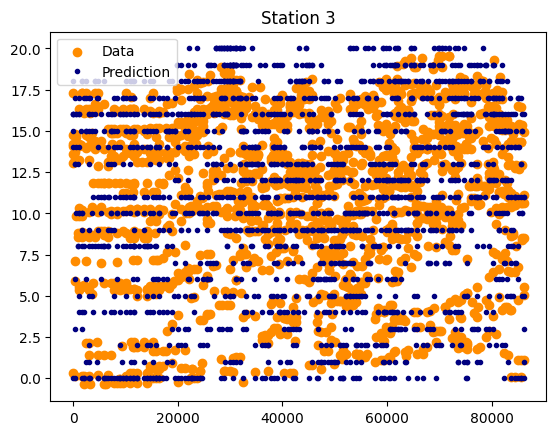

0.937825102401563
63.262910798122064
<class 'pandas.core.frame.DataFrame'> 1704 1704
1.7216367249777091


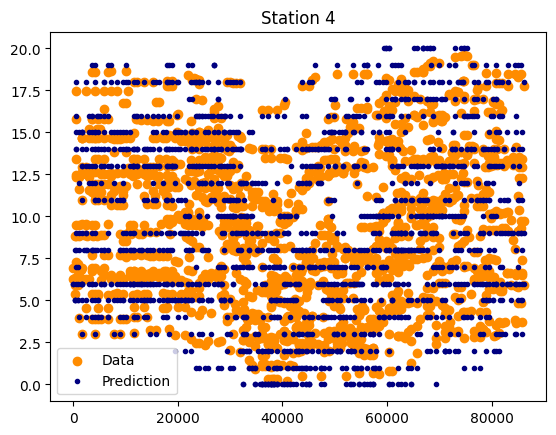

0.9494681528166257
25.095785440613028
<class 'pandas.core.frame.DataFrame'> 2088 2088
9.926645522015889


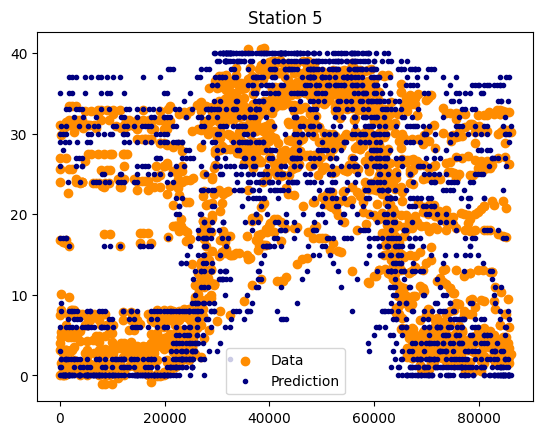

0.949107963508833
59.90862364363221
<class 'pandas.core.frame.DataFrame'> 1751 1751
1.691074861332706


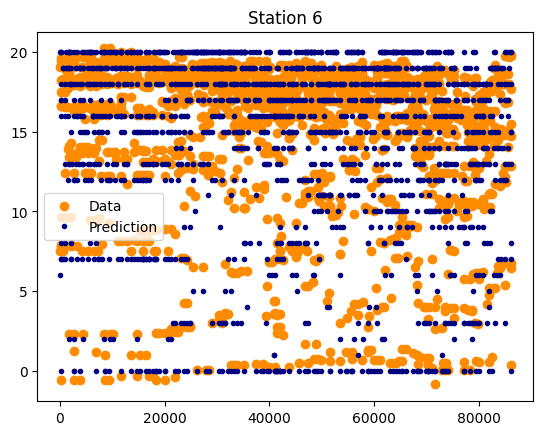

0.934436769135668
47.86476868327402
<class 'pandas.core.frame.DataFrame'> 1686 1686
3.6732059129834607


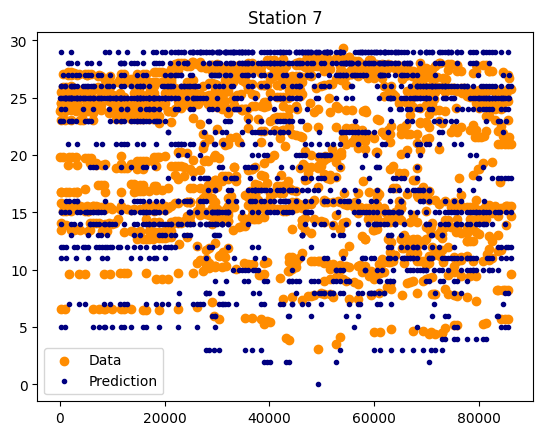

0.9096013863448924
34.43941679235797
<class 'pandas.core.frame.DataFrame'> 1989 1989
5.886513553715569


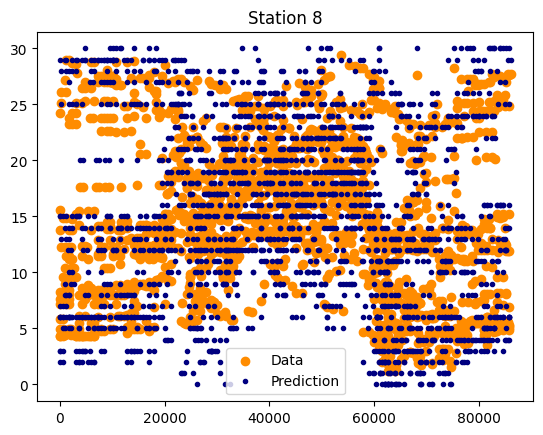

KeyboardInterrupt: 

In [18]:
predictions = []
per = []
from sklearn.ensemble import GradientBoostingRegressor
with PdfPages('RandForeststation_plots.pdf') as pdf:
    for num in station_number:
        x_set_num = x_set.loc[x_set['number'] == num]
        y_set_num = y_set[x_set['number'] == num]
        x_set_num.drop('number',axis=1)
        #scaler = StandardScaler()
        #x_scaled = scaler.fit_transform(x_set_num)
        #print(x_set_num.shape[0])
        highest  = y_set_num.max()
        reg1 = RandomForestRegressor(random_state=1)
        reg2 = GradientBoostingRegressor(random_state=0)
        reg3 = RandomForestRegressor(random_state=0)
        reg4 = GradientBoostingRegressor(random_state=1)
        ereg = VotingRegressor(estimators=[('gb', reg1), ('rf', reg2),('gb2', reg3), ('rf2', reg4)])

        x_train, x_test, y_train, y_test = train_test_split(x_set_num, y_set_num, test_size=0.33, random_state=42)
        reg = SGDRegressor(max_iter=1000, tol=1e-3)
        ereg = ereg.fit(x_train, y_train)
        y_pred = ereg.predict(x_test)
        #predictions[num] = y_pred
        count = 0
        for i in range(len(y_pred)):
            if abs(y_pred[i] - y_test.iloc[i]) <= 1:
                count += 1
        print(r_squared(y_test, y_pred))
        print(count / len(y_pred) * 100)
        print(type(x_test),y_pred.size,y_test.shape[0])
        per.append(count / len(y_pred) * 100)
        difference = np.abs(y_pred - y_test)
        mse =np.mean(np.square(difference))
        print(mse)
        plt.figure()
        plt.scatter(x_test['time_as_fraction'], y_pred, color="darkorange", label="Data")
        plt.plot(x_test['time_as_fraction'], y_test.to_numpy(), 'o', color="navy", label="Prediction", markersize=3)
        plt.axis("tight")
        plt.title(f"Station {num}")
        plt.legend()
        pdf.savefig()
        plt.show()

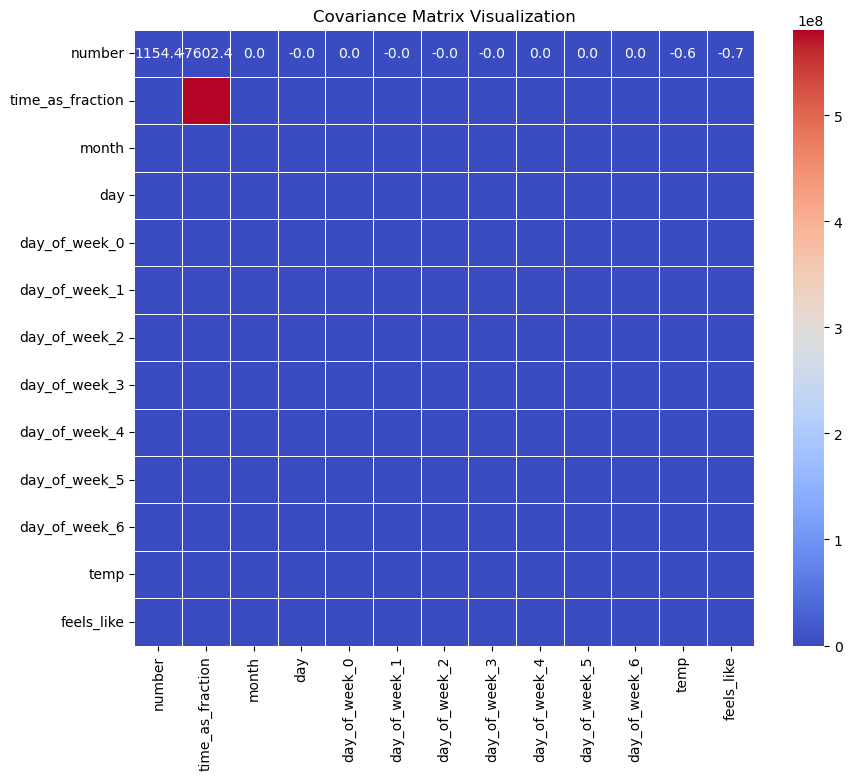